# Old ML Drought Results

In [1]:
import sys
sys.path.append("/home/leest/ml_drought")
from pathlib import Path
import xarray as xr
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import pickle

data_dir = Path('/DataDrive200/data/')

import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 300

In [2]:
import seaborn as sns
from src.utils import drop_nans_and_flatten

from src.analysis import read_train_data, read_test_data, read_pred_data

In [3]:
# !mv /DataDrive200/data/models /DataDrive200/data/models_VCI3M
# !mv /DataDrive200/data/features /DataDrive200/data/features_VCI3M

# # # # 1M test
# !mv /DataDrive200/data/models_VCI1M /DataDrive200/data/models
# !mv /DataDrive200/data/features_VCI1M /DataDrive200/data/features

# # # 3M test
# !mv /DataDrive200/data/models_VCI3M /DataDrive200/data/models
# !mv /DataDrive200/data/features_VCI3M /DataDrive200/data/features

In [4]:
EXPERIMENT =      'one_month_forecast'
TRUE_EXPERIMENT = 'one_month_forecast'
TARGET_VAR =      'boku_VCI'
# TARGET_VAR =      'VCI3M'

assert (data_dir / f'models/{EXPERIMENT}').exists()
assert (data_dir / f'models/{TRUE_EXPERIMENT}').exists()

print((data_dir / f'models/{EXPERIMENT}').as_posix())

/DataDrive200/data/models/one_month_forecast


In [5]:
X_train, y_train = read_train_data(data_dir, experiment=TRUE_EXPERIMENT)
X_test, y_test = read_test_data(data_dir, experiment=TRUE_EXPERIMENT)
static_ds = xr.open_dataset(data_dir / "features/static/data.nc")

ds = xr.merge([y_train, y_test]).sortby('time').sortby('lat')
d_ = xr.merge([X_train, X_test]).sortby('time').sortby('lat')
ds = xr.merge([ds, d_])

In [6]:
# Mask the data
from src.utils import get_ds_mask
mask = get_ds_mask(X_train.VCI)

ealstm_pred = read_pred_data('ealstm', data_dir, experiment=EXPERIMENT)[-1].where(~mask)

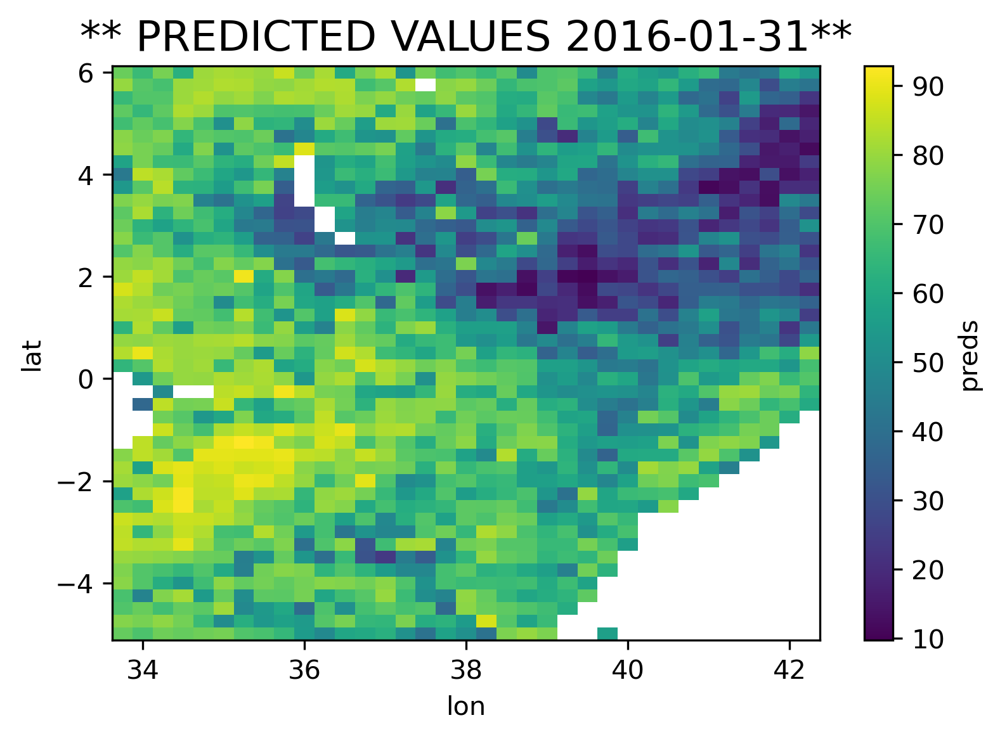

In [7]:
fig, ax = plt.subplots()
time_ix = 0
time = ealstm_pred.isel(time=time_ix).time.values
ealstm_pred.isel(time=time_ix).plot(ax=ax)
ax.set_title(f"** PREDICTED VALUES {str(time).split('T')[0]}**", size=16);

# Load Model

In [8]:
from src.models import load_model

ealstm = load_model(data_dir / 'models' / EXPERIMENT / 'ealstm' / 'model.pt')
ealstm.models_dir = data_dir / 'models' / EXPERIMENT

ealstm.experiment = TRUE_EXPERIMENT

In [9]:
print(dir(ealstm))

['__annotations__', '__class__', '__delattr__', '__dict__', '__dir__', '__doc__', '__eq__', '__format__', '__ge__', '__getattribute__', '__gt__', '__hash__', '__init__', '__init_subclass__', '__le__', '__lt__', '__module__', '__ne__', '__new__', '__reduce__', '__reduce_ex__', '__repr__', '__setattr__', '__sizeof__', '__str__', '__subclasshook__', '__weakref__', '_concatenate_data', '_convert_delta_to_raw_values', '_get_background', '_get_morris_explanations', '_get_shap_explanations', '_initialize_model', '_input_to_tuple', '_load_spatial_mask', '_make_analysis_folder', '_make_weights', '_one_hot', 'batch_size', 'clear_nans', 'current_size', 'data_path', 'data_vars', 'denormalize_y', 'dense_features', 'device', 'evaluate', 'experiment', 'explain', 'features_per_month', 'get_dataloader', 'hidden_size', 'ignore_vars', 'include_latlons', 'include_monthly_aggs', 'include_pred_month', 'include_prev_y', 'include_yearly_aggs', 'input_dense', 'load', 'model', 'model_dir', 'model_name', 'models

In [10]:
# ealstm.data_vars

## examine the data

In [11]:
# ealstm_ignore_vars = [v_ for v_ in ealstm.ignore_vars if v_ != "t2m"]

dynamic_ds = ds.drop([v for v in ealstm.ignore_vars if v in list(ds.data_vars)])

static_vars_to_include = [
    v
    for v in static_ds.data_vars
    if all([ign_v not in v for ign_v in ealstm.ignore_vars])
]
static = static_ds[static_vars_to_include]

print(dynamic_ds.data_vars)
ealstm.features_per_month  # x.shape[-1] = the number of features in dynamic data 

Data variables:
    boku_VCI  (time, lat, lon) float64 82.14 83.13 71.48 ... 29.12 77.78 49.71
    precip    (time, lat, lon) float64 4.625 4.678 4.806 4.71 ... nan nan nan
    e         (time, lat, lon) float64 -0.003227 -0.002337 -0.002842 ... nan nan
    pev       (time, lat, lon) float64 -0.005993 -0.006077 -0.005873 ... nan nan
    swvl1     (time, lat, lon) float64 0.3288 0.2993 0.334 ... nan nan nan
    swvl2     (time, lat, lon) float64 0.3176 0.3011 0.3329 ... nan nan nan
    swvl3     (time, lat, lon) float64 0.2988 0.2804 0.2896 ... nan nan nan
    swvl4     (time, lat, lon) float64 0.2902 0.2633 0.2777 ... nan nan nan


16

In [12]:
dl = ealstm.get_dataloader('train', batch_file_size=1, shuffle_data=False)
train_iter = iter(dl)
static_data = train_iter.static
print(f"N Vars: {len(list(static_data.data_vars))}")
static_data

N Vars: 23


<xarray.Dataset>
Dimensions:                                     (lat: 45, lon: 35)
Coordinates:
  * lat                                         (lat) float32 -5.0 -4.75 ... 6.0
  * lon                                         (lon) float32 33.75 ... 42.25
Data variables: (12/23)
    precip_global_mean                          (lat, lon) float64 ...
    e_global_mean                               (lat, lon) float64 ...
    pev_global_mean                             (lat, lon) float64 ...
    swvl1_global_mean                           (lat, lon) float64 ...
    swvl2_global_mean                           (lat, lon) float64 ...
    swvl3_global_mean                           (lat, lon) float64 ...
    ...                                          ...
    tree_or_shrub_cover_one_hot                 (lat, lon) float64 ...
    cropland_irrigated_or_postflooding_one_hot  (lat, lon) float64 ...
    tree_cover_one_hot                          (lat, lon) float64 ...
    shrubland_one_hot                           (lat, lon) float64 ...
    grassland_one_hot                           (lat, lon) float64 ...
    bare_areas_one_hot                          (lat, lon) float64 ...

# 

In [13]:
from typing import Dict, List, Tuple, Any, Optional

from matplotlib import cm


def get_unique_value_counts_xarray(da: xr.Dataset, dropna: bool = True) -> Dict[int, int]:
    """ NOTE only works for int-like data! (e.g. whole floats)"""
    if dropna:
        data = da.values.flatten()
        data = data[~np.isnan(data)]
    else:
        data = da.values.flatten()
    counts = np.bincount(data.astype(int))
    ii = np.nonzero(counts)[0]
    
    return dict(zip(ii, counts[ii]))


def plot_unique_value_counts(da: xr.DataArray, ax: Optional = None, label: bool = True) -> plt.Axes:
    """Plot colored histogram of integer values 0-100"""
    # create count of unique values
    counts = get_unique_value_counts_xarray(da)
    d = pd.DataFrame(
        counts, index=[0]
    )

    if ax is None:
        fig, ax = plt.subplots(figsize=(8, 5))
    
    n_unique_vals = len(counts)
    viridis = cm.get_cmap('viridis', n_unique_vals)(np.linspace(0, 1, n_unique_vals))
    g = sns.barplot(data=d, palette=viridis, ax=ax)
    ax.set_ylabel('Number of Instances')
    ax.set_title('Count of Unique Values')
    
    if label:
        for p in g.patches:
            g.annotate(
                format(p.get_height(), '.0f'), 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha = 'center', va = 'center', 
                xytext = (0, 10), 
                textcoords = 'offset points'
            )

    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    
    return ax

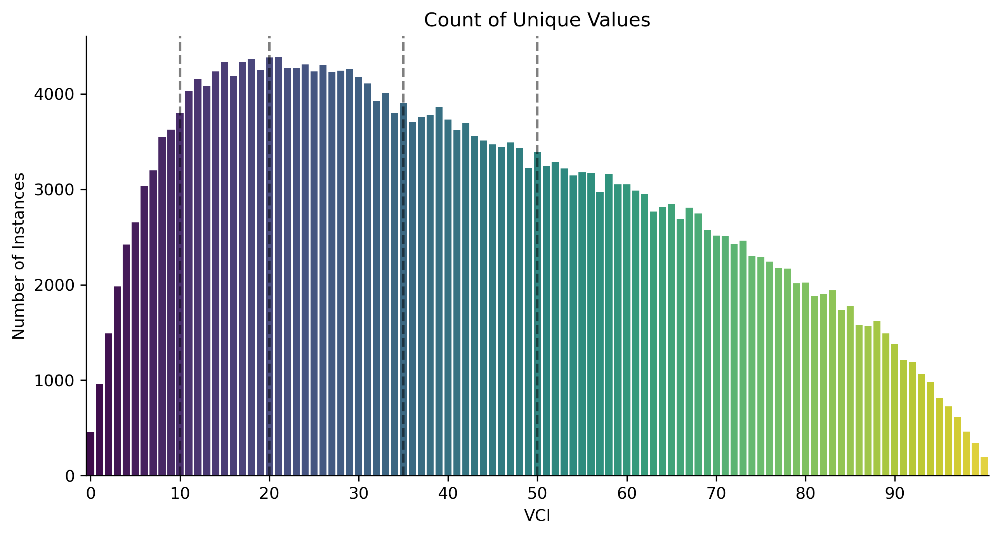

In [14]:
fig, ax = plt.subplots(figsize=(10, 5))

ax = plot_unique_value_counts(np.round(ds[TARGET_VAR]), label=False, ax=ax)

ax.set_xlabel('VCI')
ax.axvline(10, ls='--', c='k', alpha=0.5)
ax.axvline(20, ls='--', c='k', alpha=0.5)
ax.axvline(35, ls='--', c='k', alpha=0.5)
ax.axvline(50, ls='--', c='k', alpha=0.5)

ax.set_xticks(np.arange(0, 100, 10))
ax.set_xticklabels(np.arange(0, 100, 10));

# Load in model predictions

In [15]:
from src.utils import get_ds_mask
mask = get_ds_mask(X_train.VCI)

bline_pred = read_pred_data('previous_month', data_dir, experiment=EXPERIMENT)[-1]# .where(~mask)
lstm_pred = read_pred_data('rnn', data_dir, experiment=EXPERIMENT)[-1]# .where(~mask)
ealstm_pred = read_pred_data('ealstm', data_dir, experiment=EXPERIMENT)[-1]#.where(~mask)
lr_pred = read_pred_data('linear_regression', data_dir, experiment=EXPERIMENT)[-1]#.where(~mask)
ln_pred = read_pred_data('linear_network', data_dir, experiment=EXPERIMENT)[-1]#.where(~mask)

In [ ]:
preds_dict = {"previous_month": bline_pred, 
"rnn": lstm_pred, 
"ealstm": ealstm_pred, 
"linear_regression": lr_pred, 
"linear_network": ln_pred}

fig, axs = plt.subplots(3, 2, figsize=(6*2, 4*3))

for ix, (model_name, preds) in enumerate(preds_dict.items()):
    ax = axs[np.unravel_index(ix, (3,2))]
    preds.isel(time=0).plot(ax=ax, vmin=0, vmax=100, cmap='BrBG')
    ax.set_title(model_name)


ax = axs[np.unravel_index(5, (3,2))]
y_test[TARGET_VAR].isel(time=0).plot(ax=ax, vmin=0, vmax=100, cmap='BrBG')
    
fig.tight_layout()

# Make table of comparison

In [17]:
from src.analysis import annual_scores

models = ['ealstm', 'rnn', 'previous_month', 'linear_network', 'linear_regression']

# load the monthly scores dictionary
monthly_scores = annual_scores(
    data_path=data_dir,
    models=models,
    metrics=['rmse', 'r2'],
    pred_years=[y for y in range(2016, 2019)],
    experiment=EXPERIMENT,
    true_data_experiment=TRUE_EXPERIMENT,
    target_var=TARGET_VAR,
    verbose=False,
    to_dataframe=True
)
monthly_scores['time'] = monthly_scores.apply(lambda row: pd.to_datetime(f"{int(row.month)}-{int(row.year)}"), axis=1)
monthly_scores.head()

,month,year,ealstm,rnn,previous_month,linear_network,linear_regression,metric,time
0,1.0,2016.0,13.768305,14.241547,21.886197,32.799530,32.774728,rmse,2016-01-01
1,2.0,2016.0,12.614843,13.823008,21.712380,32.212164,26.890971,rmse,2016-02-01
2,3.0,2016.0,14.454184,14.312614,17.362805,29.618036,24.048710,rmse,2016-03-01
3,4.0,2016.0,11.138392,11.179895,15.724187,15.454515,20.577301,rmse,2016-04-01
4,5.0,2016.0,13.959078,13.605063,17.737472,18.397587,20.715286,rmse,2016-05-01


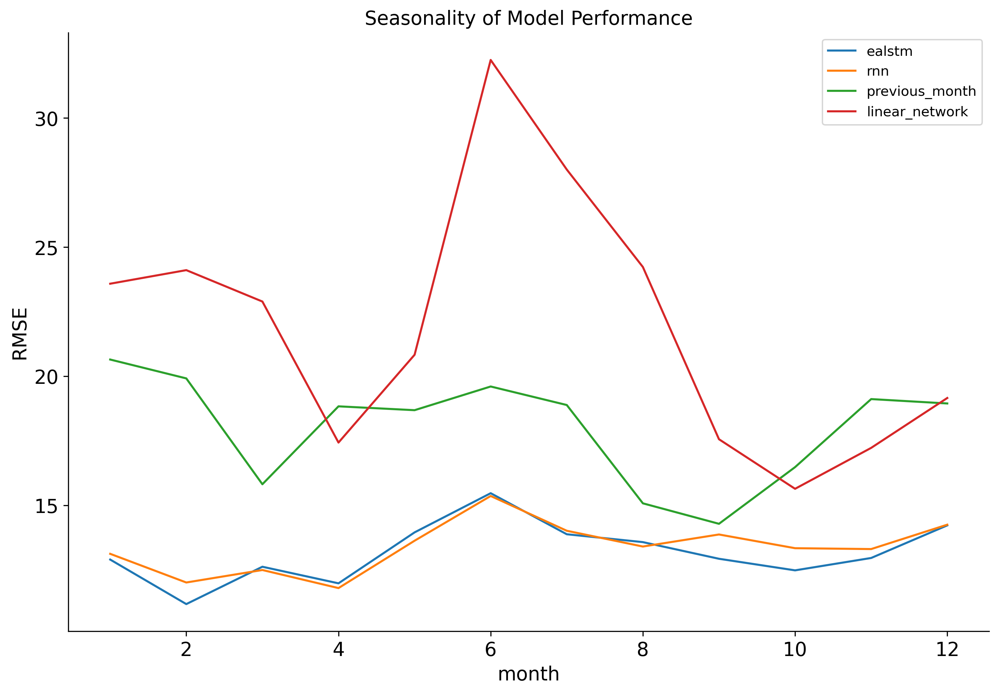

In [18]:
fig, ax = plt.subplots(figsize=(12, 8))

metric = 'rmse'

models2 = ['ealstm', 'rnn', 'previous_month', 'linear_network', ]
for model in models2:
    (
        monthly_scores
        .where(monthly_scores.metric == metric)
        .groupby('month').mean().reset_index()
        .plot(x='month', y=model, label=model, ax=ax)
    )
plt.legend()
ax.set_title('Seasonality of Model Performance')
ax.set_ylabel(metric.upper());
ylim = (0, 15) if TARGET_VAR == "VCI3M" else ax.get_ylim()
ax.set_ylim(ylim)

for item in ([ax.title, ax.xaxis.label, ax.yaxis.label]
                  + ax.get_xticklabels() + ax.get_yticklabels()):
        item.set_fontsize(14)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)



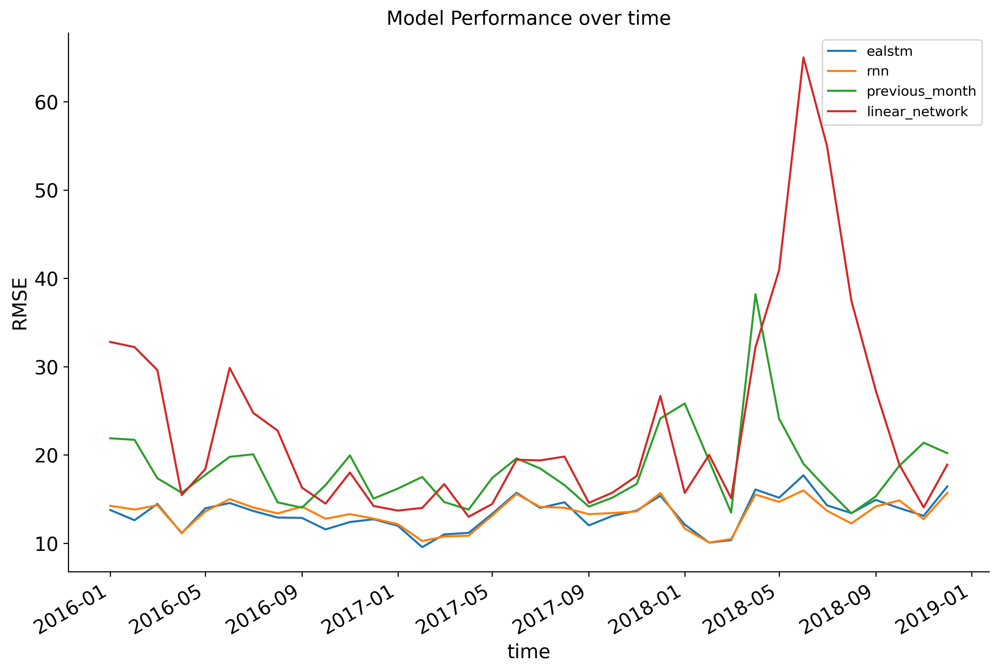

In [19]:
fig, ax = plt.subplots(figsize=(12, 8))
for model in models2: # 
    (
        monthly_scores
        .where(monthly_scores.metric == metric)
        .set_index('time')
        .plot(y=model, label=model, ax=ax)
    )
plt.legend()
ax.set_title('Model Performance over time')
ax.set_ylabel(metric.upper());

for item in ([ax.title, ax.xaxis.label, ax.yaxis.label]
                  + ax.get_xticklabels() + ax.get_yticklabels()):
        item.set_fontsize(14)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Explore Temporal Errors

In [20]:
def calculate_error(true_da, pred_da, method=None):
    if method == 'squared':
        vals = (true_da.values - pred_da.values) ** 2
    elif method == 'absolute':
        vals = abs((true_da.values - pred_da.values))
    else:
        vals = (true_da.values - pred_da.values)
    da = xr.ones_like(true_da) * vals
    return da.rename(f'{method + "_" if method is not None else ""}error')


ealstm_error = calculate_error(
    pred_da=ealstm_pred.transpose("time", "lat", "lon"),
    true_da=y_test[TARGET_VAR].transpose("time", "lat", "lon"),
    method='squared'
)
lstm_error = calculate_error(
    pred_da=lstm_pred.transpose("time", "lat", "lon"),
    true_da=y_test[TARGET_VAR].transpose("time", "lat", "lon"),
    method='squared'
)
bline_error = calculate_error(
    pred_da=bline_pred.transpose("time", "lat", "lon"),
    true_da=y_test[TARGET_VAR].transpose("time", "lat", "lon"),
    method='squared'
)
lr_error = calculate_error(
    pred_da=lr_pred.transpose("time", "lat", "lon"),
    true_da=y_test[TARGET_VAR].transpose("time", "lat", "lon"),
    method='squared'
)
ln_error = calculate_error(
    pred_da=ln_pred.transpose("time", "lat", "lon"),
    true_da=y_test[TARGET_VAR].transpose("time", "lat", "lon"),
    method='squared'
)

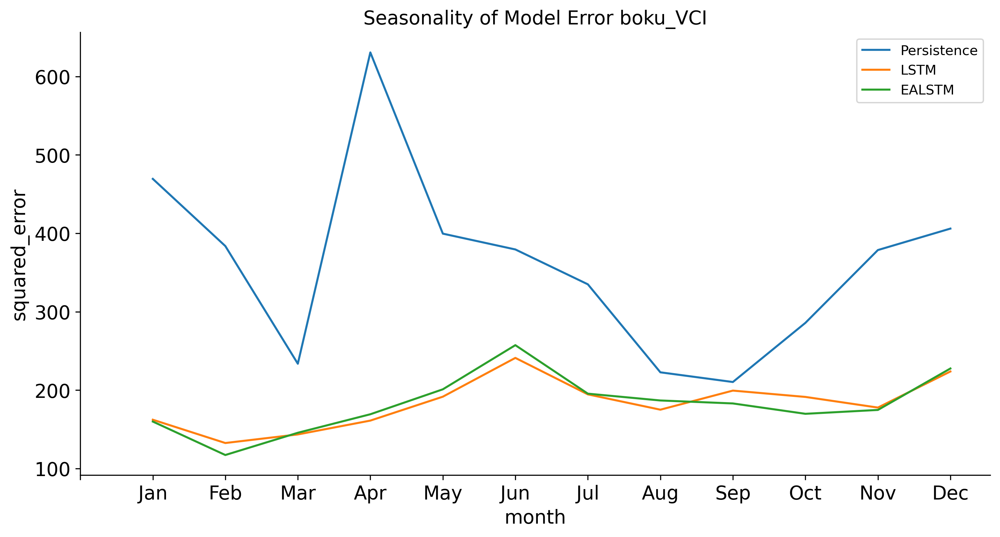

In [21]:
import calendar 
mths = [m for m in calendar.month_abbr]
fig, ax = plt.subplots(figsize=(12, 6))

bline_error.groupby('time.month').mean(dim=['time']).mean(dim=['lat', 'lon']).plot(ax=ax, label='Persistence')
lstm_error.groupby('time.month').mean(dim=['time']).mean(dim=['lat', 'lon']).plot(ax=ax, label='LSTM')
ealstm_error.groupby('time.month').mean(dim=['time']).mean(dim=['lat', 'lon']).plot(ax=ax, label='EALSTM')
plt.legend()

ax.set_title(f'Seasonality of Model Error {TARGET_VAR}', size=16);
ax.set_xticks([i for i in range(0, 13)])
ax.set_xticklabels(mths)
ax.set_ylabel(bline_error.name, size=14)

for item in ([ax.title, ax.xaxis.label, ax.yaxis.label]
                  + ax.get_xticklabels() + ax.get_yticklabels()):
        item.set_fontsize(14)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Explore Temporal Errors

In [22]:
from src.analysis import spatial_rmse, spatial_r2

# -------- LSTM
lstm_rmse = spatial_rmse(
    y_test[TARGET_VAR].transpose("time", "lat", "lon"), 
    lstm_pred.transpose("time", "lat", "lon")
)

# -------- EALSTM
ealstm_rmse = spatial_rmse(
    y_test[TARGET_VAR].transpose("time", "lat", "lon"), 
    ealstm_pred.transpose("time", "lat", "lon")
)

# -------- Baseline
bline_rmse = spatial_rmse(
    y_test[TARGET_VAR].transpose("time", "lat", "lon"), 
    bline_pred.transpose("time", "lat", "lon")
)

# -------- Linear Network
ln_rmse = spatial_rmse(
    y_test[TARGET_VAR].transpose("time", "lat", "lon"), 
ln_pred.transpose("time", "lat", "lon")
)

# -------- Linear Regression
lr_rmse = spatial_rmse(
    y_test[TARGET_VAR].transpose("time", "lat", "lon"), 
lr_pred.transpose("time", "lat", "lon")
)


# calculate mean performance scores
lstm_mean = lstm_rmse.mean().values
ealstm_mean = ealstm_rmse.mean().values
bline_mean = bline_rmse.mean().values
lr_mean = lr_rmse.mean().values
ln_mean = ln_rmse.mean().values

print("lstm_mean RMSE: ".ljust(20), f"{lstm_mean:.2f}")
print("ealstm_mean RMSE: ".ljust(20), f"{ealstm_mean:.2f}")
print("bline_mean RMSE: ".ljust(20), f"{bline_mean:.2f}")
print("lr_mean RMSE: ".ljust(20), f"{lr_mean:.2f}")
print("ln_mean RMSE: ".ljust(20), f"{ln_mean:.2f}")

lstm_mean RMSE:      13.24
ealstm_mean RMSE:    13.23
bline_mean RMSE:     18.69
lr_mean RMSE:        25.94
ln_mean RMSE:        25.68


In [23]:
# -------- LSTM
lstm_r2 = spatial_r2(
    y_test[TARGET_VAR].transpose("time", "lat", "lon"), 
    lstm_pred.transpose("time", "lat", "lon")
)

# -------- EALSTM
ealstm_r2 = spatial_r2(
    y_test[TARGET_VAR].transpose("time", "lat", "lon"), 
    ealstm_pred.transpose("time", "lat", "lon")
)

# -------- Baseline
bline_r2 = spatial_r2(
    y_test[TARGET_VAR].transpose("time", "lat", "lon"), 
    bline_pred.transpose("time", "lat", "lon")
)

# -------- Linear Network
ln_r2 = spatial_r2(
    y_test[TARGET_VAR].transpose("time", "lat", "lon"), 
ln_pred.transpose("time", "lat", "lon")
)

# -------- Linear Regression
lr_r2 = spatial_r2(
    y_test[TARGET_VAR].transpose("time", "lat", "lon"), 
lr_pred.transpose("time", "lat", "lon")
)


# calculate mean performance scores
lstm_mean = lstm_r2.mean().values
ealstm_mean = ealstm_r2.mean().values
bline_mean = bline_r2.mean().values
lr_mean = lr_r2.mean().values
ln_mean = ln_r2.mean().values

print("lstm_mean r2: ".ljust(20), f"{lstm_mean:.2f}")
print("ealstm_mean r2: ".ljust(20), f"{ealstm_mean:.2f}")
print("bline_mean r2: ".ljust(20), f"{bline_mean:.2f}")
print("lr_mean r2: ".ljust(20), f"{lr_mean:.2f}")
print("ln_mean r2: ".ljust(20), f"{ln_mean:.2f}")

lstm_mean r2:        0.72
ealstm_mean r2:      0.72
bline_mean r2:       0.44
lr_mean r2:          0.00
ln_mean r2:          0.14


/home/leest/ml_drought/src/analysis/evaluation.py:54: RuntimeWarning: invalid value encountered in true_divide
  r2_vals = 1 - (np.nansum((true_da.values - pred_da.values) ** 2, axis=0)) / (
/home/leest/ml_drought/src/analysis/evaluation.py:54: RuntimeWarning: invalid value encountered in true_divide
  r2_vals = 1 - (np.nansum((true_da.values - pred_da.values) ** 2, axis=0)) / (
/home/leest/ml_drought/src/analysis/evaluation.py:54: RuntimeWarning: invalid value encountered in true_divide
  r2_vals = 1 - (np.nansum((true_da.values - pred_da.values) ** 2, axis=0)) / (
/home/leest/ml_drought/src/analysis/evaluation.py:54: RuntimeWarning: invalid value encountered in true_divide
  r2_vals = 1 - (np.nansum((true_da.values - pred_da.values) ** 2, axis=0)) / (
/home/leest/ml_drought/src/analysis/evaluation.py:54: RuntimeWarning: invalid value encountered in true_divide
  r2_vals = 1 - (np.nansum((true_da.values - pred_da.values) ** 2, axis=0)) / (


# CDF Comparisons

In [24]:
rmses = {
    "lstm": lstm_rmse,
    "ealstm": ealstm_rmse,
    "bline": bline_rmse,
#     "lr": lr_rmse,
    "ln": ln_rmse,
}

r2s = {
    "lstm": lstm_r2,
    "ealstm": ealstm_r2,
    "bline": bline_r2,
#     "lr": lr_r2,
    "ln": ln_r2,
}

In [25]:
def plot_cdf(data: np.array, ax: Optional[plt.Axes] = None, **kwargs):
    """plot the sorted_data array against the number 
    of items smaller than each element in the array

    # https://stackoverflow.com/a/24576863/9940782
    """
    sorted_data = np.sort(data)
    sorted_data = sorted_data[~np.isnan(sorted_data)]
    
    # compute the 
    yvals = np.arange(len(sorted_data)) / (len(sorted_data) - 1)
    
    if ax is None:
        fig, ax = plt.subplots()
    ax.plot(sorted_data, yvals, **kwargs)
    
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.legend()
    
    return ax

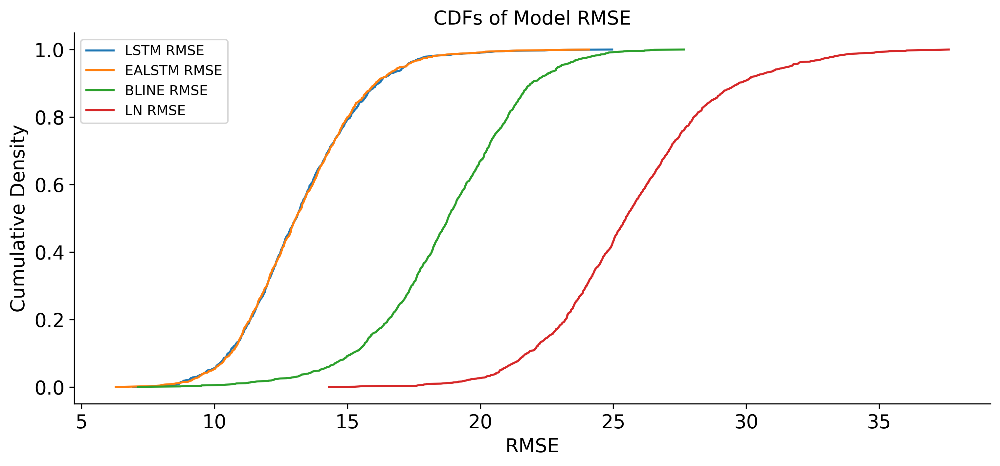

In [26]:
scale = 1
fig, ax = plt.subplots(figsize=(12*scale, 5*scale))

for model, rmse in rmses.items():
    data = rmse.values.flatten()
    plot_cdf(data, ax=ax, **dict(label=f'{model.upper()} RMSE'))

ax.set_title('CDFs of Model RMSE')
ax.set_xlabel('RMSE')
ax.set_ylabel('Cumulative Density')


for item in ([ax.title, ax.xaxis.label, ax.yaxis.label]
                  + ax.get_xticklabels() + ax.get_yticklabels()):
        item.set_fontsize(14)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

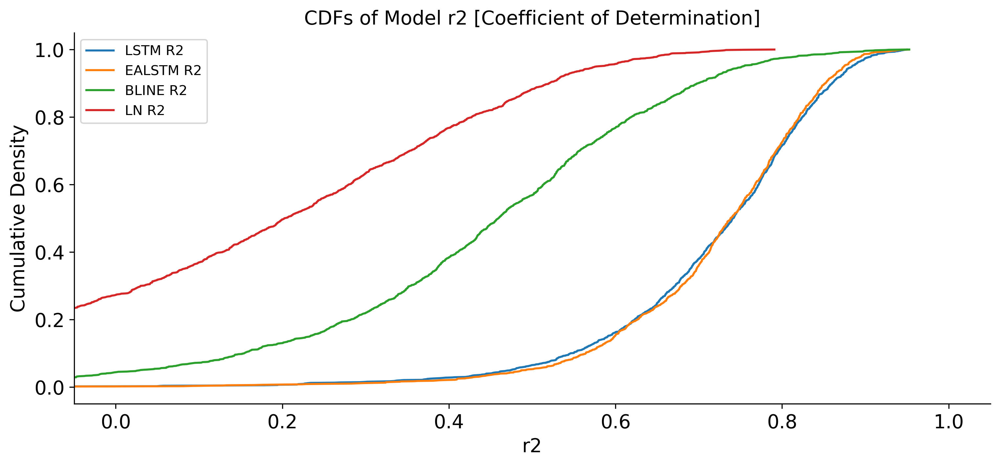

In [27]:
fig, ax = plt.subplots(figsize=(12, 5))

for model, r2 in r2s.items():
    data = r2.values.flatten()
    plot_cdf(data, ax=ax, **dict(label=f'{model.upper()} R2'))

ax.set_title('CDFs of Model r2 [Coefficient of Determination]')
ax.set_xlabel('r2')
ax.set_ylabel('Cumulative Density')
ax.set_xlim(-0.05, 1.05)


for item in ([ax.title, ax.xaxis.label, ax.yaxis.label]
                  + ax.get_xticklabels() + ax.get_yticklabels()):
        item.set_fontsize(14)


ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# How perform in different Regions

In [28]:
import warnings
from src.analysis.region_analysis import RegionGeoPlotter, AdministrativeRegionAnalysis
warnings.filterwarnings('ignore')

analyzer = AdministrativeRegionAnalysis(
    data_dir=data_dir,
    experiment=EXPERIMENT,
    true_data_experiment=TRUE_EXPERIMENT
)
r = RegionGeoPlotter(data_dir)

Initialised the Region Analysis for experiment: one_month_forecast
Models: ['linear_regression', 'linear_network', 'climatology', 'previous_month', 'rnn', 'ealstm']
Regions: ['district_l2_kenya.nc', 'province_l1_kenya.nc']
Region Type: administrative_boundaries
The RegionGeoPlotter requires `geopandas` to be installed.
GroupbyRegion requires geopandas to be installed


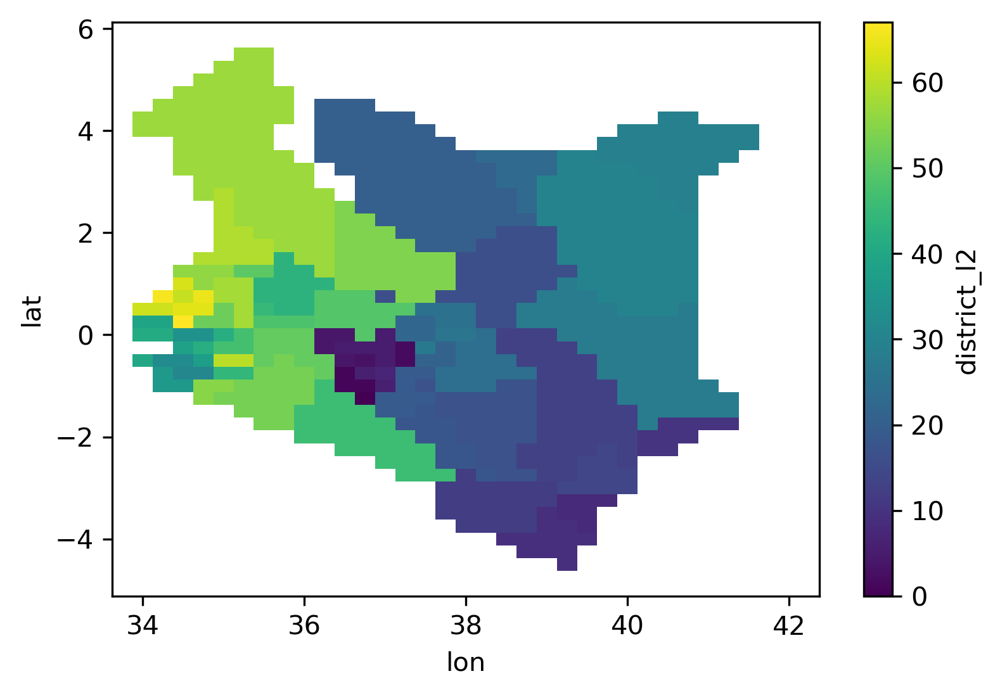

In [29]:
region_path = analyzer.region_data_paths[0]
admin_level_name = region_path.name.replace('.nc', '')
region_da, region_lookup, region_group_name = analyzer.load_region_data(region_path)
valid_region_ids = [k for k in region_lookup.keys()]

region_da.plot()

In [30]:
def get_region_mask(region: str):
    lookup = dict(zip(region_lookup.values(), region_lookup.keys()))
    region_id = lookup[region]
    
    return ~region_da.where(region_da == region_id).isnull()

In [31]:
analyzer.analyze()

* Analyzing for district_l2_kenya *

** Analyzing for linear_regression-district_l2_kenya **
** Written linear_regression csv to /DataDrive200/data/analysis/region_analysis/linear_regression/linear_regression_district_l2_kenya.csv **

** Analyzing for linear_network-district_l2_kenya **
** Written linear_network csv to /DataDrive200/data/analysis/region_analysis/linear_network/linear_network_district_l2_kenya.csv **

** Analyzing for climatology-district_l2_kenya **
** Written climatology csv to /DataDrive200/data/analysis/region_analysis/climatology/climatology_district_l2_kenya.csv **

** Analyzing for previous_month-district_l2_kenya **
** Written previous_month csv to /DataDrive200/data/analysis/region_analysis/previous_month/previous_month_district_l2_kenya.csv **

** Analyzing for rnn-district_l2_kenya **
** Written rnn csv to /DataDrive200/data/analysis/region_analysis/rnn/rnn_district_l2_kenya.csv **

** Analyzing for ealstm-district_l2_kenya **
** Written ealstm csv to /DataDr

In [32]:
region_plotter = analyzer.create_model_performance_by_region_geodataframe()
df = analyzer.df.copy()
df = df.set_index('datetime')
df = df.rename(columns={"true_mean_value": TARGET_VAR, "predicted_mean_value": "preds"})

gdf = region_plotter.gdf

all_gdf = region_plotter.merge_all_model_performances_gdfs(analyzer.df)
all_gdf.head()

GroupbyRegion requires geopandas to be installed
Reading file: KEN_admin2_2002_DEPHA.shp
Reading file: Ken_Districts.shp
Reading file: Ken_Divisions.shp
Reading file: Kenya wards.shp
Reading file: Ken_Locations.shp
Reading file: Ken_Sublocations.shp
* Read shapefiles and stored in `RegionGeoPlotter.region_gdfs` *
* Assigned the complete GeoDataFrame to `RegionGeoPlotter.gdf`
* Assigned the complete GeoDataFrame to `RegionGeoPlotter.gdf`


,admin_level_name,model,datetime,region_name,predicted_mean_value,true_mean_value,DISTNAME,geometry,PROVINCE
0,district_l2_kenya,linear_regression,2016-01-31,BUTERE/MUMIAS,NaN,NaN,BUTERE/MUMIAS,"POLYGON ((34.49405 0.46995, 34.49555 0.46665, ...",NaN
1,district_l2_kenya,previous_month,2016-01-31,BUTERE/MUMIAS,NaN,NaN,BUTERE/MUMIAS,"POLYGON ((34.49405 0.46995, 34.49555 0.46665, ...",NaN
2,district_l2_kenya,climatology,2016-01-31,BUTERE/MUMIAS,NaN,NaN,BUTERE/MUMIAS,"POLYGON ((34.49405 0.46995, 34.49555 0.46665, ...",NaN
3,district_l2_kenya,ealstm,2016-01-31,BUTERE/MUMIAS,NaN,NaN,BUTERE/MUMIAS,"POLYGON ((34.49405 0.46995, 34.49555 0.46665, ...",NaN
4,district_l2_kenya,rnn,2016-01-31,BUTERE/MUMIAS,NaN,NaN,BUTERE/MUMIAS,"POLYGON ((34.49405 0.46995, 34.49555 0.46665, ...",NaN


In [33]:
# from scripts.drafts.plot_ts_scatter import plot_area_scatter, plot_timeseries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from typing import Optional, Tuple, Dict, Any, List

def plot_area_scatter(
    df: pd.DataFrame, 
    region: str,
    metrics_df: Optional[pd.DataFrame] = None, 
    ax=None,
    target_var: str = 'VCI3M',
    region_name: Optional[str] = None,
    area_col_str: str = 'region_name',
    **kwargs,
):
    # select station
    d = df.query(f"{area_col_str} == '{region}'").drop(columns=area_col_str)

    if ax is None:
        fig, ax = plt.subplots(figsize=(12, 6))
    else:
        fig = plt.gcf()

    # plot scatter
    if "preds" in d.columns:
        ax.plot(d[target_var], d['preds'], 'kx', alpha=0.6, label='Data Point', **kwargs)
    else:
        numeric_columns = [c for c in data_df.columns if (data_df[c].dtype == "float64") & (c != TARGET_VAR)]
        colors = sns.color_palette()[:len(numeric_columns)]
        for numeric_col, color in zip(numeric_columns, colors):
            ax.plot(d[target_var], d[numeric_col], 'kx', alpha=0.6, label=f'{numeric_col}', color=color, **kwargs)
    # plot 1:1 line
    line_1_1_x = np.linspace(d[target_var].min(), d[target_var].max(), 10)
    ax.plot(line_1_1_x, line_1_1_x, 'k--', label='1:1 Line')

    ax.set_xlabel('Observed')
    ax.set_ylabel('Predicted')
    title = f'Station {region}' + f" {region_name}" if region_name is not None else f'Station {region}'
    ax.set_title(title)

    ax.legend();

    if False:
        # making the plot pretty
        for item in ([ax.title, ax.xaxis.label, ax.yaxis.label]
                          + ax.get_xticklabels() + ax.get_yticklabels()):
                item.set_fontsize(12)

    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

    return fig, ax


def plot_timeseries(
    df: pd.DataFrame,
    region: str,
    metrics_df: Optional[pd.DataFrame] = None,
    ax=None,
    region_name: Optional[str] = None,
    plot_years: Optional[List[int]] = None,
    area_col_str: str = 'region_name',
):
    """Plot the Observed vs. Preds for the region"""
    if ax is None:
        fig, ax = plt.subplots()
    else:
        fig = plt.gcf()

    # plot the station
    if "preds" in df.columns:
        if plot_years is None:
            df.query(f"{area_col_str} == '{region}'").drop(columns=area_col_str).plot(ax=ax)
        else:
            (
                df.loc[np.isin(df.index.year, plot_years)]
                .query(f"{area_col_str} == '{region}'")
                .drop(columns=area_col_str).plot(ax=ax)
            )
    else:
        if plot_years is None:
            df.query(f"{area_col_str} == '{region}'")[TARGET_VAR].plot(ax=ax, )
            df.query(f"{area_col_str} == '{region}'").drop(columns=[area_col_str, TARGET_VAR]).plot(ax=ax)
        else:
            (
                df.loc[np.isin(df.index.year, plot_years)]
                .query(f"{area_col_str} == '{region}'")
                .drop(columns=area_col_str).plot(ax=ax)
            )
                
    # get the error metrics
    if metrics_df is None:
        station_title = f"{region}" if region_name is not None else region
        ax.set_title(f"{station_title}")
    else:
        rmse_val = metrics_df.query(f"region == '{region}'").rmse.values[0]
        r2_val = metrics_df.query(f"region == '{region}'").r2.values[0]
        # nse_val = metrics_df.query(f"region == '{region}'").nse.values[0]
        # set the title
        station_title = f"{region} {region_name}" if region_name is not None else region
        ax.set_title(f"{station_title}\nRMSE: {rmse_val:.2f} R2: {r2_val:.2f} NSE: {nse_val:.2f}")

    return fig, ax

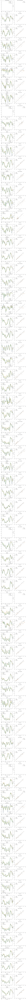

In [34]:
regions = all_gdf.region_name.unique()
data_df = df.copy().set_index("datetime") if "datetime" in df.columns else df.copy()
data_df = data_df.rename(columns={"true_mean_value": TARGET_VAR, "predicted_mean_value": "preds"}).drop(columns=["admin_level_name"])

m1 = data_df.reset_index().set_index(['datetime', 'region_name']).query('model == "rnn"').rename(columns={"preds": "lstm"}).drop(columns=['model'])
m2 = data_df.reset_index().set_index(['datetime', 'region_name']).query('model == "ealstm"').rename(columns={"preds": "ealstm"}).drop(columns=['model', TARGET_VAR])
data_df = m1.join(m2).reset_index().set_index('datetime')

# model = 'ealstm'
plot_years = None # [2016]
scale = 0.8

with plt.rc_context({"figure.dpi": 100}):
    fig, axs = plt.subplots(len(regions), 2, figsize=((12*scale), (6*scale)*len(regions)))

    for ix, region in enumerate(regions):
        try:
            # plot the timeseries
            plot_timeseries(
                data_df, # .drop(columns=TARGET_VAR),  # data_df.query(f"model == '{model}'"), 
                region, 
                metrics_df=None, 
                ax=axs[ix, 0], 
                region_name=region, 
                plot_years=plot_years
            )
            data_df.query(f"region_name=='{region}'")[TARGET_VAR].plot(ax=axs[ix, 0], c='k', label='Observed VCI', ls='--')
            axs[ix, 0].set_ylim(0, 100)
            axs[ix, 0].legend()

            # plot the scatterplot
            plot_area_scatter(
                data_df,  # data_df.query(f"model == '{model}'"), 
                region, 
                metrics_df=None, 
                ax=axs[ix, 1],
                target_var=TARGET_VAR
            )
            axs[ix, 1].set_xlim(0, 100)
            axs[ix, 1].set_ylim(0, 100)
        except TypeError:
            print(f"** {region_name} data does not exist in the predictions! **")

        plt.tight_layout()

# Spatial Maps of performance

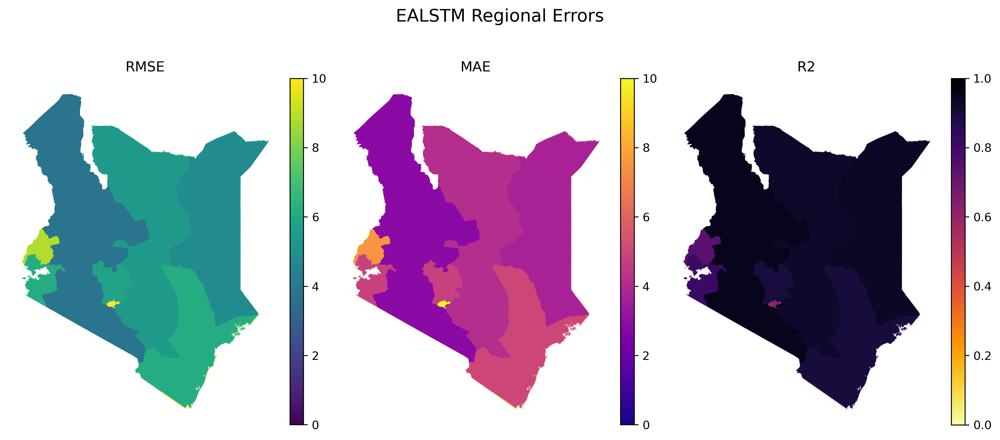

In [35]:
max_val = 10
kwargs = dict(rmse_vmax=max_val, mae_vmax=max_val, mae_vmin=0, rmse_vmin=0)

rmse = region_plotter.get_metric("rmse", gdf, **kwargs)
mae = region_plotter.get_metric("mae", gdf, **kwargs)
r2 = region_plotter.get_metric("r2", gdf, **kwargs)

# build multi-axis plot
fig, axs = plt.subplots(1, 3, figsize=(12, 8))
for i, metric in enumerate([rmse, mae, r2]):
    ax = axs[i]
    ax = region_plotter.plot_metric(gdf=gdf.loc[gdf["model"] == "ealstm"], ax=ax, metric=metric)
    ax.axis("off")
    
plt.gcf().suptitle('EALSTM Regional Errors', size=15)
plt.tight_layout(rect=[0, 0.03, 1, 1.25])

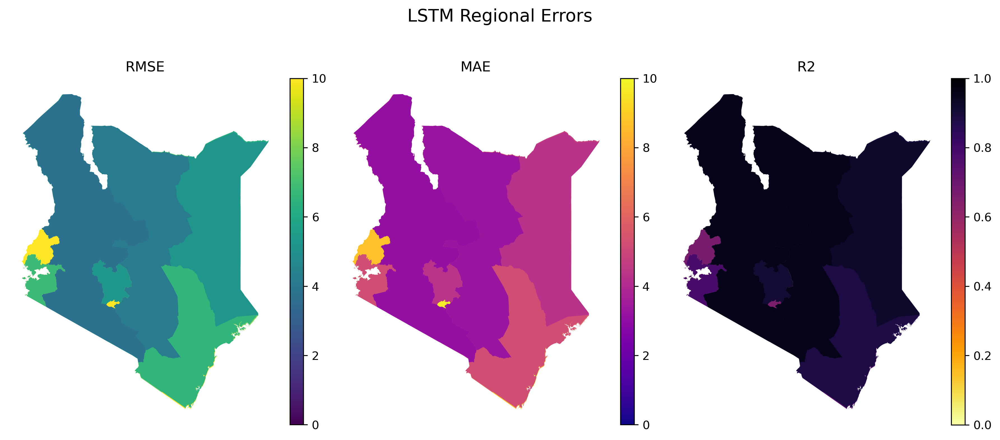

In [36]:
kwargs = dict(rmse_vmax=max_val, mae_vmax=max_val, mae_vmin=0, rmse_vmin=0)

rmse = region_plotter.get_metric("rmse", gdf, **kwargs)
mae = region_plotter.get_metric("mae", gdf, **kwargs)
r2 = region_plotter.get_metric("r2", gdf, **kwargs)

# build multi-axis plot
fig, axs = plt.subplots(1, 3, figsize=(12, 8))
for i, metric in enumerate([rmse, mae, r2]):
    ax = axs[i]
    ax = region_plotter.plot_metric(gdf=gdf.loc[gdf["model"] == "rnn"], ax=ax, metric=metric)
    ax.axis("off")
    
plt.gcf().suptitle('LSTM Regional Errors', size=15)
plt.tight_layout(rect=[0, 0.03, 1, 1.25])

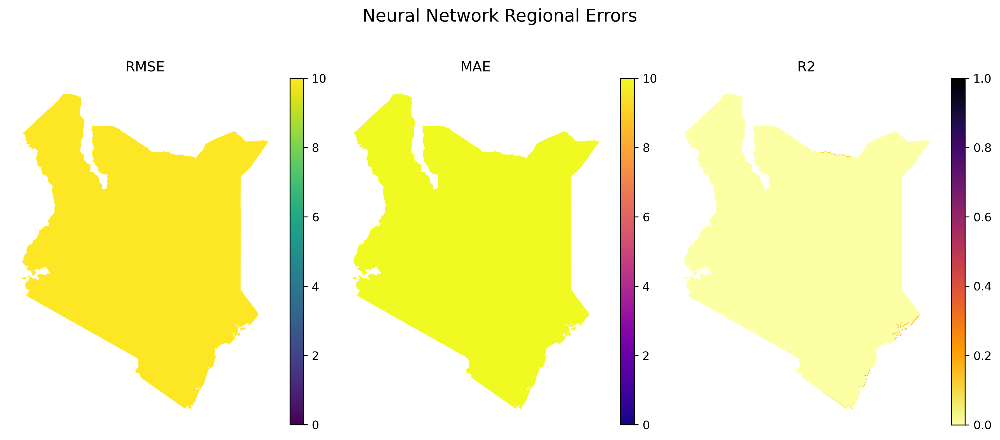

In [37]:
kwargs = dict(rmse_vmax=max_val, mae_vmax=max_val, mae_vmin=0, rmse_vmin=0)

rmse = region_plotter.get_metric("rmse", gdf, **kwargs)
mae = region_plotter.get_metric("mae", gdf, **kwargs)
r2 = region_plotter.get_metric("r2", gdf, **kwargs)

# build multi-axis plot
fig, axs = plt.subplots(1, 3, figsize=(12, 8))
for i, metric in enumerate([rmse, mae, r2]):
    ax = axs[i]
    ax = region_plotter.plot_metric(gdf=gdf.loc[gdf["model"] == "linear_network"], ax=ax, metric=metric)
    ax.axis("off")
    
plt.gcf().suptitle('Neural Network Regional Errors', size=15)
plt.tight_layout(rect=[0, 0.03, 1, 1.25])

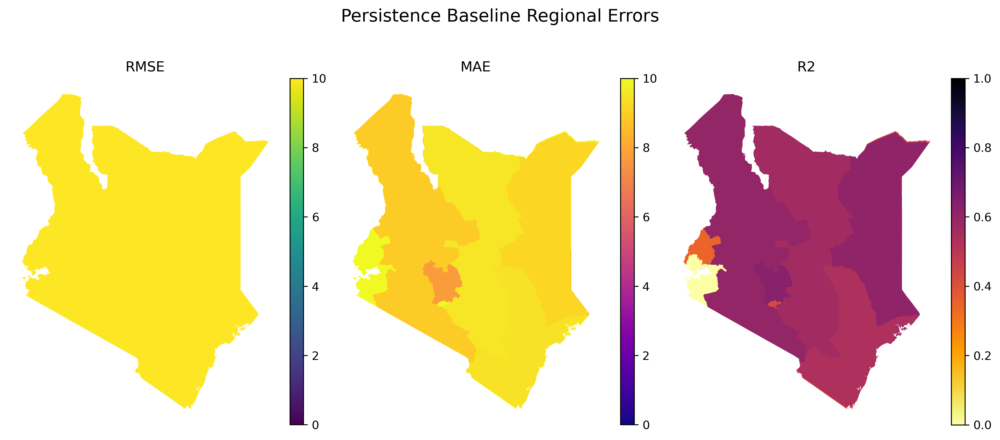

In [38]:
kwargs = dict(rmse_vmax=max_val, mae_vmax=max_val, mae_vmin=0, rmse_vmin=0)

rmse = region_plotter.get_metric("rmse", gdf, **kwargs)
mae = region_plotter.get_metric("mae", gdf, **kwargs)
r2 = region_plotter.get_metric("r2", gdf, **kwargs)

# build multi-axis plot
fig, axs = plt.subplots(1, 3, figsize=(12, 8))
for i, metric in enumerate([rmse, mae, r2]):
    ax = axs[i]
    ax = region_plotter.plot_metric(gdf=gdf.loc[gdf["model"] == "previous_month"], ax=ax, metric=metric)
    ax.axis("off")

plt.gcf().suptitle('Persistence Baseline Regional Errors', size=15)
plt.tight_layout(rect=[0, 0.03, 1, 1.25])

# Scatterplots of performance

In [39]:
from scripts.drafts.eng_utils import nans_mask_from_multiple_arrays

def get_model_yhat_y_arrays(pred_ds: xr.Dataset, ds: xr.Dataset) -> Tuple[np.ndarray, np.ndarray]:
    """"""
    target_y = ds[TARGET_VAR].sel(time=pred_ds.time)
    multimask = nans_mask_from_multiple_arrays([pred_ds, target_y])
    yhat = pred_ds.where(~multimask).values
    yhat = yhat[~np.isnan(yhat)]
    y = target_y.where(~multimask).values
    y = y[~np.isnan(y)]

    assert y.shape == yhat.shape
    return y, yhat

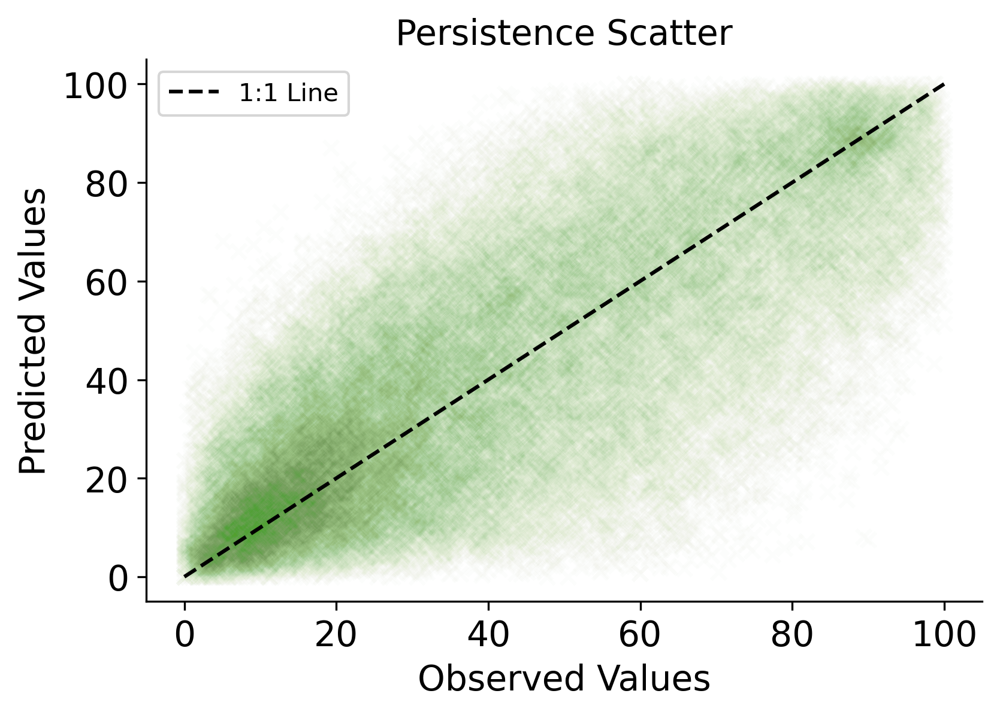

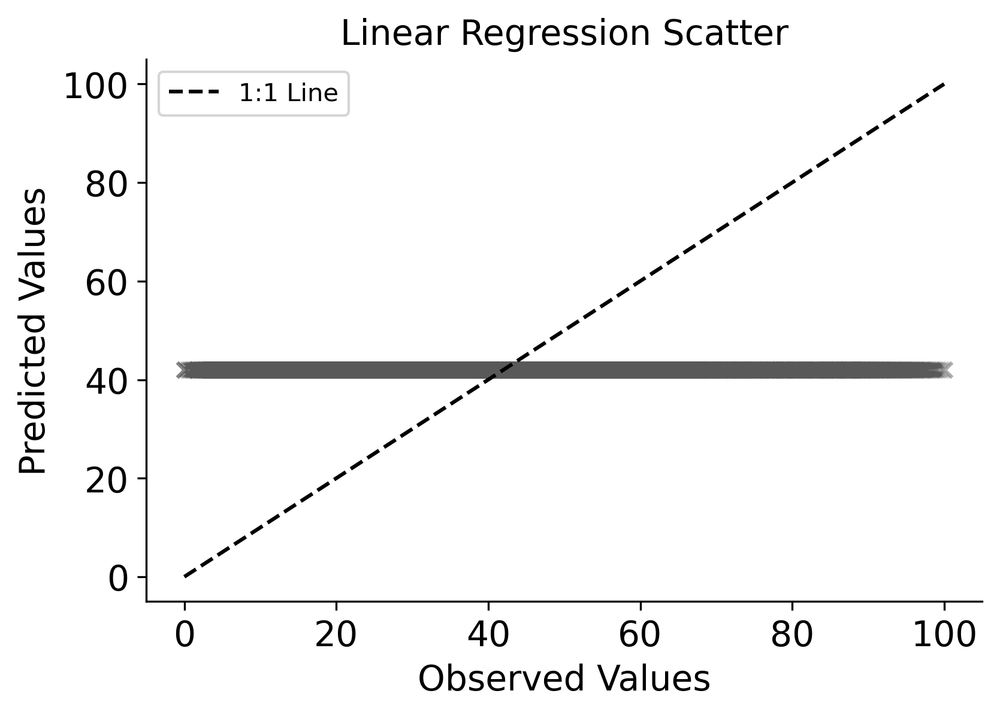

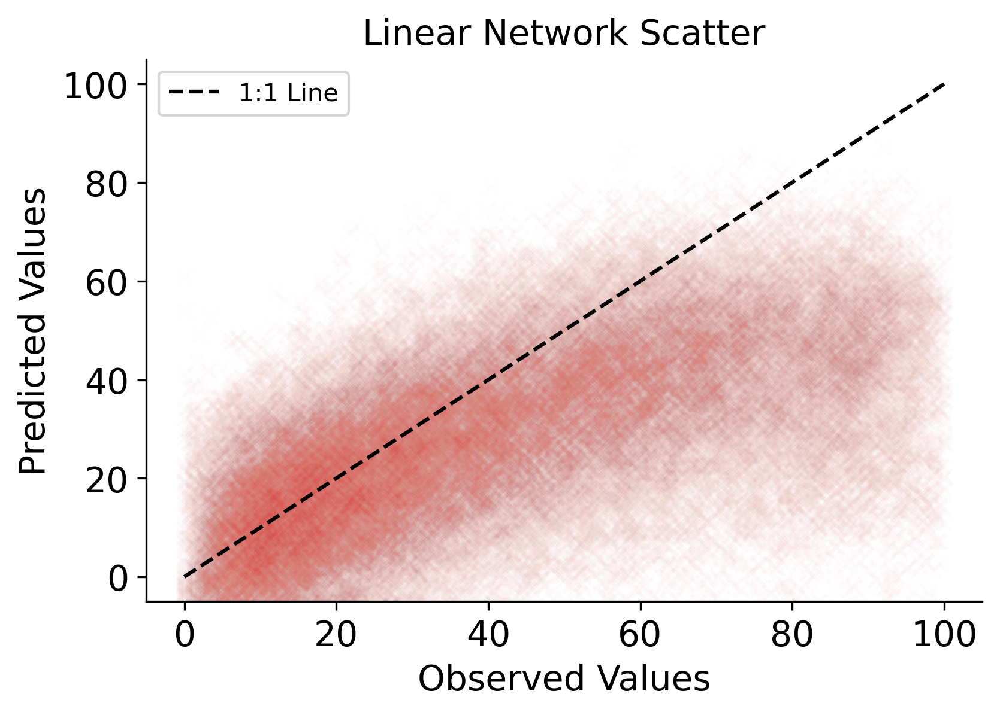

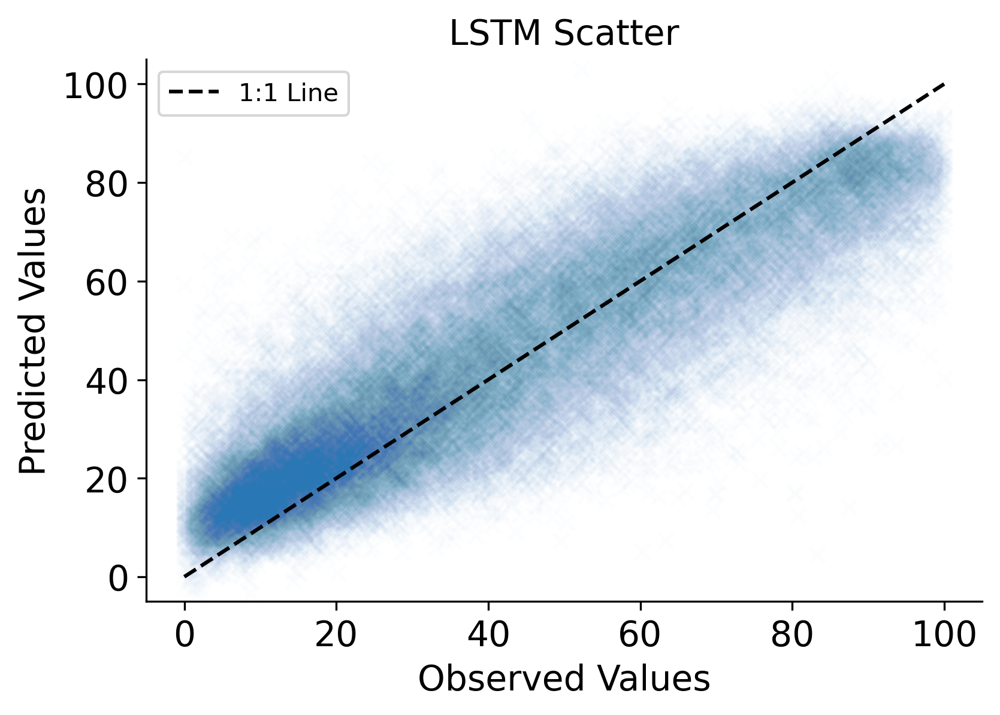

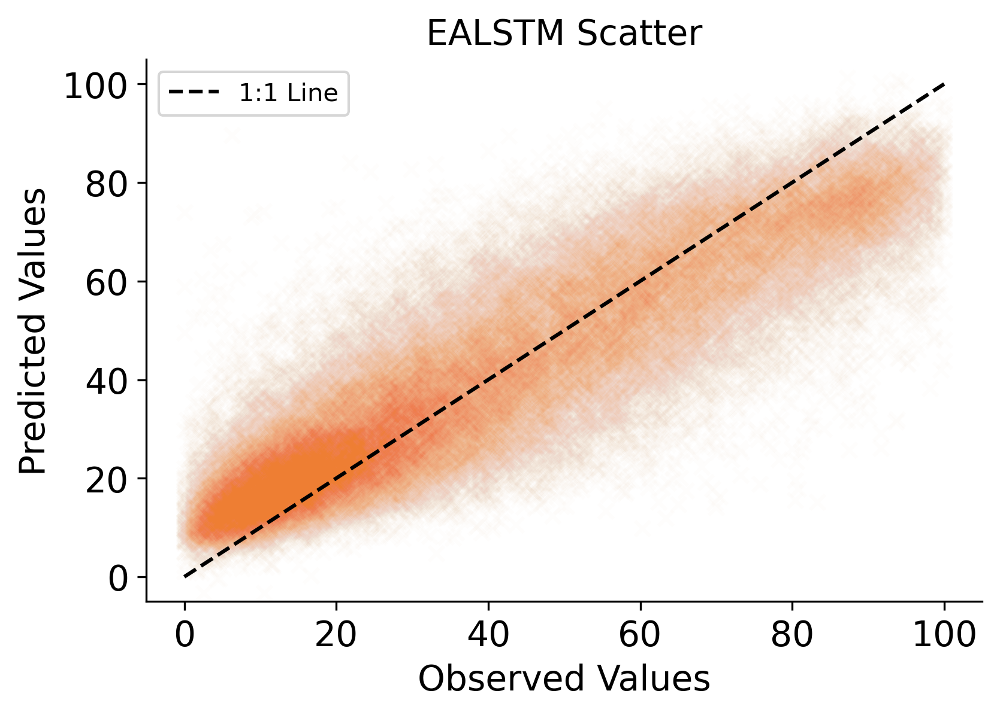

In [40]:
model_preds = [bline_pred, lr_pred, ln_pred, lstm_pred, ealstm_pred]
models = ["Persistence", "Linear Regression", "Linear Network", "LSTM", "EALSTM"]
colors = ["#52a02e", "#595959", "#d7392e", "#2977b4", "#ee7e33",]

for (model, pred_ds, color) in zip(models, model_preds, colors):
    y, yhat = get_model_yhat_y_arrays(pred_ds, ds)
    fig, ax = plt.subplots(figsize=(6, 4))
    ax.scatter(y, yhat, marker='x', c=color, alpha=0.01)

    # plot 1:1 line
    line_1_1_x = np.linspace(y.min(), y.max(), 10)
    ax.plot(line_1_1_x, line_1_1_x, 'k--', label='1:1 Line')

    ax.set_title(f"{model} Scatter")
    ax.set_ylim(ax.get_xlim())
    ax.set_ylabel("Predicted Values")
    ax.set_xlabel("Observed Values")

    ax.legend()
    for item in ([ax.title, ax.xaxis.label, ax.yaxis.label]
                  + ax.get_xticklabels() + ax.get_yticklabels()):
        item.set_fontsize(14)

    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)

# Explore Drought Classes

# Explore Performance for different Drought Classes

```
VCI3M Limits   | Description                        | Value
-----------------------------------------------------------
0 <= x <10     | Extreme vegetation deficit         |  1
10 <= x <20    | Severe vegetation deficit          |  2
20 <= x <35    | Moderate vegetation deficit        |  3
35 <= x <50    | Normal vegetation conditions       |  4
50 <= x <=100  | Above normal vegetation conditions |  5
```

# Calculate VDI

In [41]:
y_pred = ealstm_pred.compute()
y_true = ds[TARGET_VAR].sel(time=y_pred.time)

In [42]:
from src.analysis import VegetationDeficitIndex

v = VegetationDeficitIndex(
    data_dir / 'interim/VCI_preprocessed/data_kenya.nc',
    rolling_window=1
)
vdi_obs = v.vegetation_index_classify(y_true, 'vdi')
vdi_pred = v.vegetation_index_classify(y_pred, 'vdi')
vdi_train = v.vegetation_index_classify(y_train[TARGET_VAR], 'vdi')

This index is fit on a 3 month VCI moving average. Are you sure you want to fit for 1?


In [43]:
print("Overall Metrics")
print("---------------")
print(
    "Correct Classification:".ljust(30), f"{(vdi_obs == vdi_pred).mean().values:.2f}"
)
print(
    "Out by 1:".ljust(30), f"{(abs(vdi_obs - vdi_pred) == 1).mean().values:.2f}"
)
print(
    "Out by 2:".ljust(30), f"{(abs(vdi_obs - vdi_pred) == 2).mean().values:.2f}"
)
print(
    "Out by 3:".ljust(30), f"{(abs(vdi_obs - vdi_pred) == 3).mean().values:.2f}"
)
print("NOTE: bad metric because we have unbalanced class sizes")

Overall Metrics
---------------
Correct Classification:        0.60
Out by 1:                      0.33
Out by 2:                      0.06
Out by 3:                      0.01
NOTE: bad metric because we have unbalanced class sizes


In [44]:
def plot_cdf(data: np.array, ax: Optional[plt.Axes] = None, **kwargs):
    """plot the sorted_data array against the number 
    of items smaller than each element in the array

    # https://stackoverflow.com/a/24576863/9940782
    """
    sorted_data = np.sort(data)
    sorted_data = sorted_data[~np.isnan(sorted_data)]
    
    # compute the proportion of values (y axis)
    yvals = np.arange(len(sorted_data)) / (len(sorted_data) - 1)
    
    if ax is None:
        fig, ax = plt.subplots()
    ax.plot(sorted_data, yvals, **kwargs)
    
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.legend()
    
    return ax

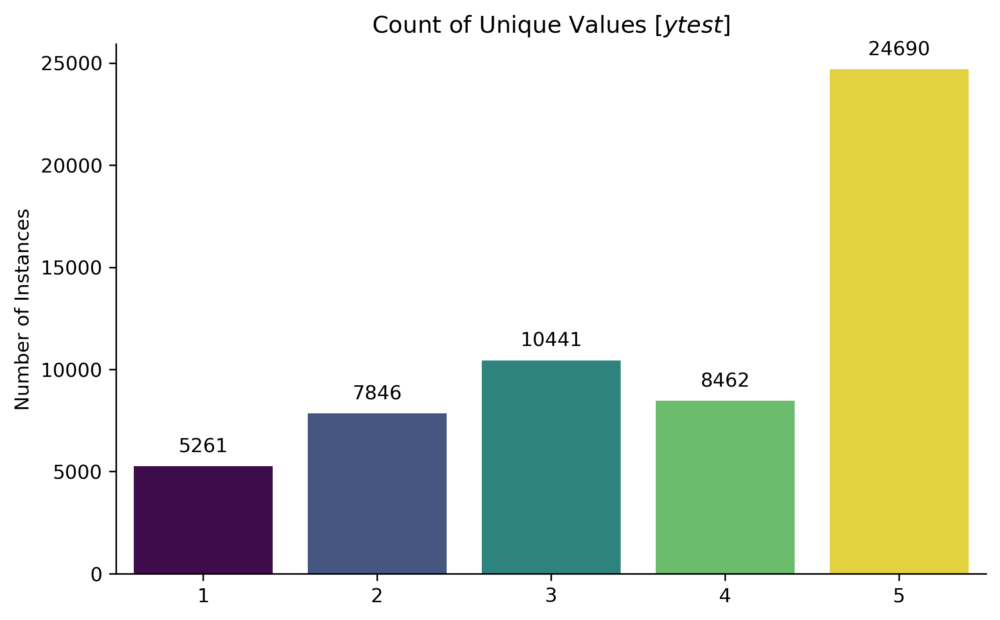

In [45]:
from matplotlib import cm


def get_unique_value_counts_xarray(da: xr.Dataset, dropna: bool = True) -> Dict[int, int]:
    """ NOTE only works for int-like data! (e.g. whole floats)"""
    if dropna:
        data = da.values.flatten()
        data = data[~np.isnan(data)]
    else:
        data = da.values.flatten()
    counts = np.bincount(data.astype(int))
    ii = np.nonzero(counts)[0]
    
    return dict(zip(ii, counts[ii]))


def plot_unique_value_counts(da: xr.DataArray, ax: Optional = None, label: bool = True) -> plt.Axes:
    """"""
    # create count of unique values
    counts = get_unique_value_counts_xarray(da)
    d = pd.DataFrame(
        counts, index=[0]
    )

    if ax is None:
        fig, ax = plt.subplots(figsize=(8, 5))
    
    n_unique_vals = len(counts)
    viridis = cm.get_cmap('viridis', n_unique_vals)(np.linspace(0, 1, n_unique_vals))
    g = sns.barplot(data=d, palette=viridis, ax=ax)
    ax.set_ylabel('Number of Instances')
    ax.set_title('Count of Unique Values')
    
    if label:
        for p in g.patches:
            g.annotate(
                format(p.get_height(), '.0f'), 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha = 'center', va = 'center', 
                xytext = (0, 10), 
                textcoords = 'offset points'
            )

    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    
    return ax


ax = plot_unique_value_counts(vdi_obs)
ax.set_title('Count of Unique Values [$y test$]');

# ax = plot_unique_value_counts(vdi_pred.clip(1, 5))
# ax.set_title('Count of Unique Values [$y pred$]');

# ax = plot_unique_value_counts(vdi_train.clip(1, 5))
# ax.set_title('Count of Unique Values [$y train$]');

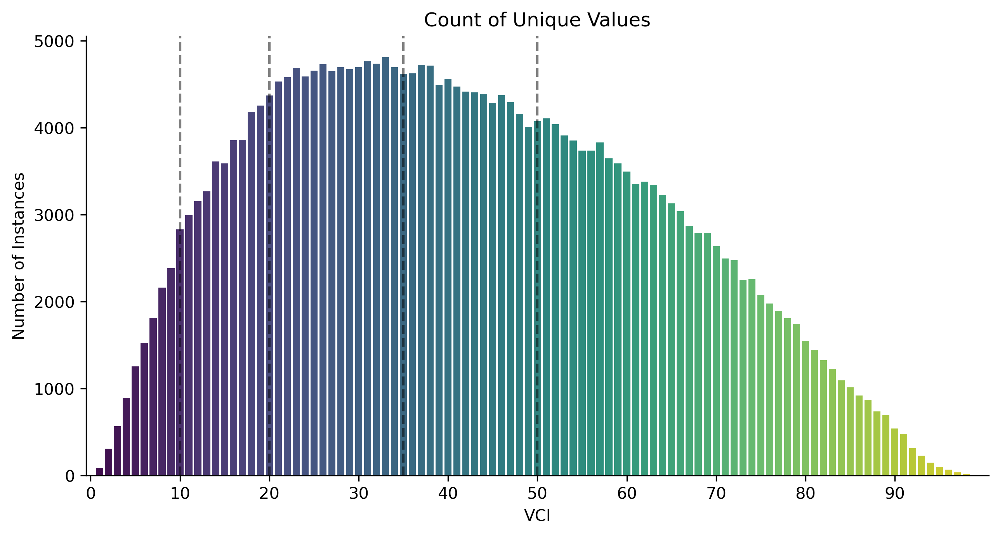

In [46]:
fig, ax = plt.subplots(figsize=(10, 5))

ax = plot_unique_value_counts(np.round(ds['VCI3M']), label=False, ax=ax)

ax.set_xlabel('VCI')
ax.axvline(10, ls='--', c='k', alpha=0.5)
ax.axvline(20, ls='--', c='k', alpha=0.5)
ax.axvline(35, ls='--', c='k', alpha=0.5)
ax.axvline(50, ls='--', c='k', alpha=0.5)

ax.set_xticks(np.arange(0, 100, 10))
ax.set_xticklabels(np.arange(0, 100, 10));

## Confusion Matrix

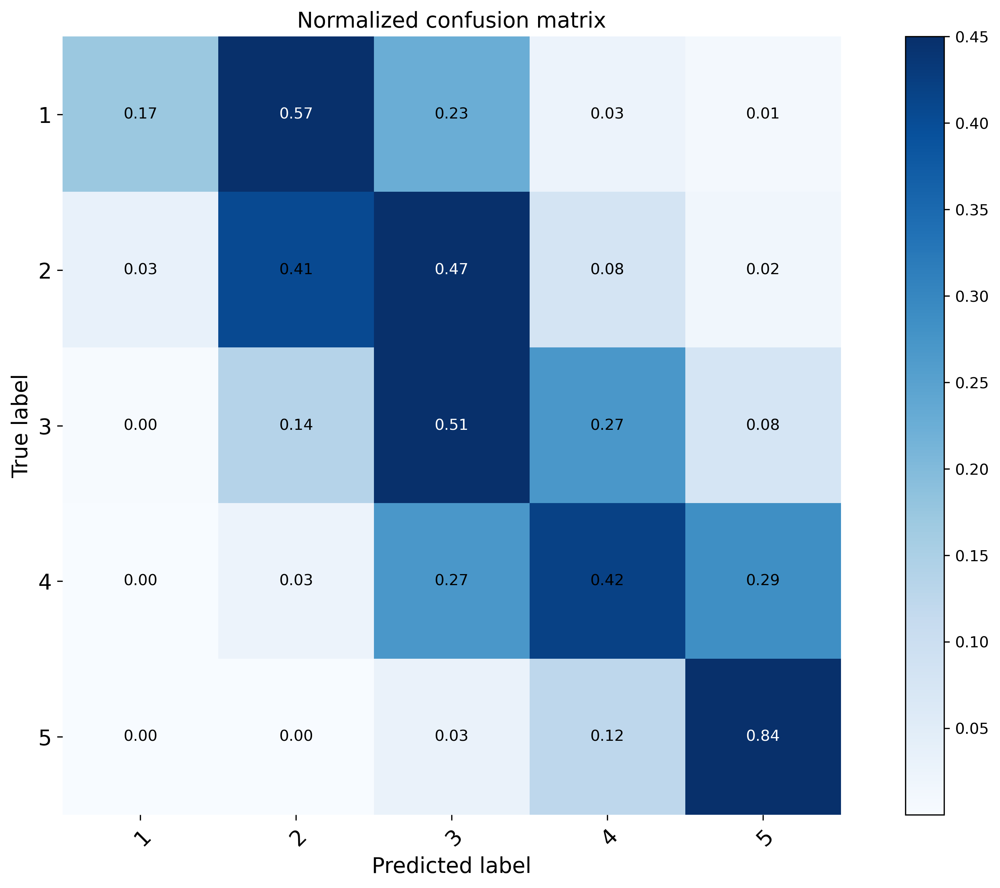

In [47]:
from scripts.drafts.plot_confusion import vdi_confusion_matrix

vmax = 0.75 if TARGET_VAR == "VCI3M" else 0.45

ax, conf_mat = vdi_confusion_matrix(
    vdi_obs,
    vdi_pred,
    normalize=True,
    **dict(vmax=vmax)
)

for item in ([ax.title, ax.xaxis.label, ax.yaxis.label]
                  + ax.get_xticklabels() + ax.get_yticklabels()):
        item.set_fontsize(14)
        
ax.spines['top'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)

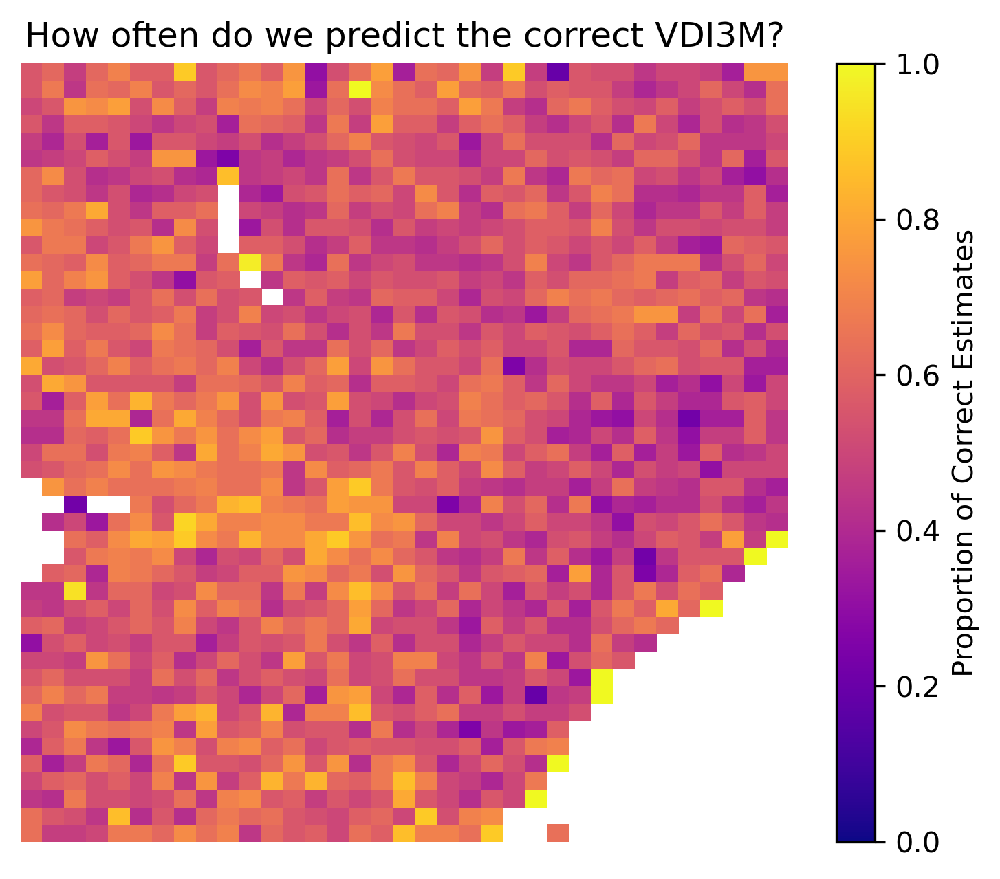

In [48]:
def plot_correct_predictions(pred, true, mask, ax=None) -> plt.Axes:
    """"""
    if ax is None:
        _, ax = plt.subplots(figsize=(6, 5))
    
    img = ax.pcolor(
        (pred == true).mean(dim='time').where(~mask).values,
        cmap='plasma',
        vmin=0, vmax=1
    )
    cbar = plt.colorbar(img, ax=ax)
    cbar.ax.set_ylabel("Proportion of Correct Estimates");
    
    ax.axis('off');
    
    return ax

ax = plot_correct_predictions(vdi_pred, vdi_obs, mask)
ax.set_title('How often do we predict the correct VDI3M?');

### do matrices vary by month?

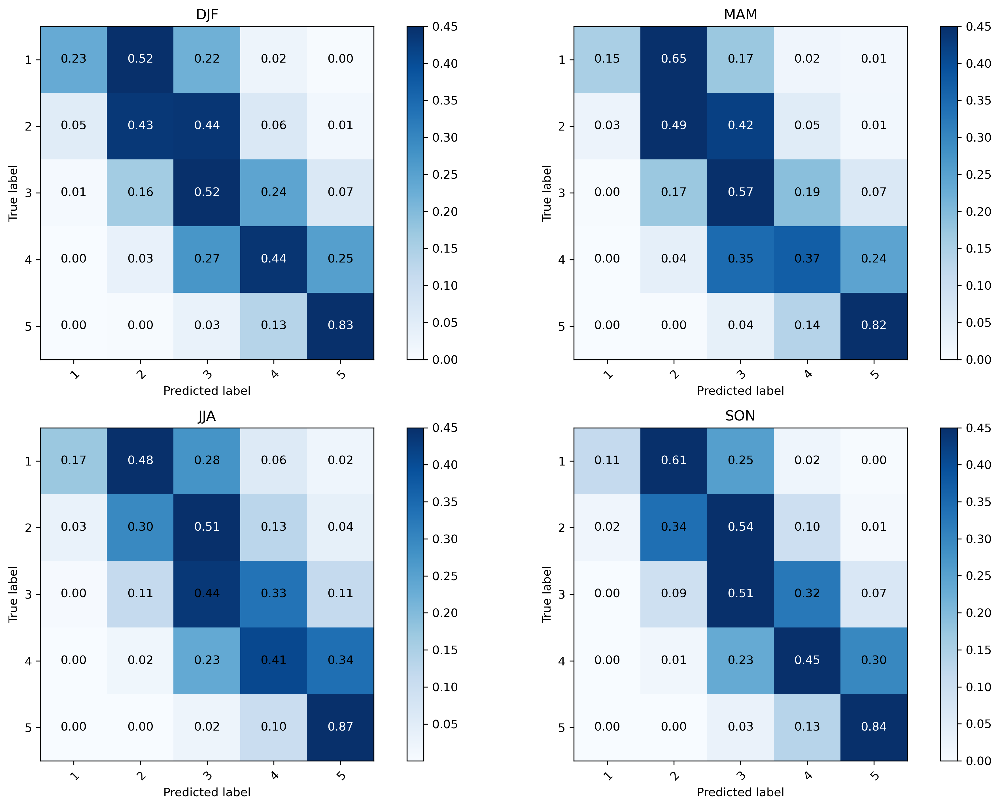

In [49]:
vmax = 0.75 if TARGET_VAR == "VCI3M" else 0.45


def create_season_ds(vdi):
    vdi['season'] = vdi['time.season']
    return vdi

seasons = ['DJF', 'MAM', 'JJA', 'SON']

scale = 0.6
fig, axs = plt.subplots(2,2, figsize=((12*scale) * 2, (8*scale) * 2))

for ix, season in enumerate(seasons):
    ax = axs[np.unravel_index(ix, (2, 2))]
    season_pred = create_season_ds(vdi_pred)
    season_pred = season_pred[season_pred['season'] == season]

    season_true = create_season_ds(vdi_obs)
    season_true = season_true[season_true['season'] == season]

    vdi_confusion_matrix(
        season_true,
        season_pred,
        normalize=True,
        **dict(vmax=vmax),
        title=season,
        ax=ax
    )

### performance per month?

In [50]:
import calendar

def create_month_ds(vdi):
    vdi['month'] = vdi['time.month']
    return vdi

# label dataarray with month and season
month_pred = create_month_ds(vdi_pred)
month_true = create_month_ds(vdi_obs)

# 
all_months = []
for month in range(1, 13):
    n_data_points = len(month_true[month_true.month == month].time)
    
    # how many times do we correctly predict the VDI?
    sum_of_correct = (
        (month_pred[month_pred.month == month] == month_true[month_true.month == month])
        .sum(dim='time')
    )
    sum_of_correct = sum_of_correct.assign_coords(time=month).expand_dims('time')
    
    # create proportion of correct predictions
    prop_of_correct = sum_of_correct / n_data_points
    all_months.append(prop_of_correct)
    
month_errors = xr.concat(all_months, dim='time').where(~mask)

# create dataframe of mean over space
month_df = month_errors.mean(dim=['lat', 'lon']).to_dataframe()
month_df = month_df.reset_index().rename(columns={'time': 'month_id', "vdi": "prop_correct"})
month_df['month'] = month_df.apply(lambda x: calendar.month_abbr[int(x.month_id)], axis=1)
month_df['season'] = ['DJF', 'DJF', 'MAM', 'MAM', 'MAM', 'JJA', 'JJA', 'JJA', 'SON', 'SON', 'SON', 'DJF']
month_df.head()

,month_id,prop_correct,month,season
0,1,0.582459,Jan,DJF
1,2,0.527175,Feb,DJF
2,3,0.493585,Mar,MAM
3,4,0.552601,Apr,MAM
4,5,0.615115,May,MAM


Text(0.5, 0, 'Month')

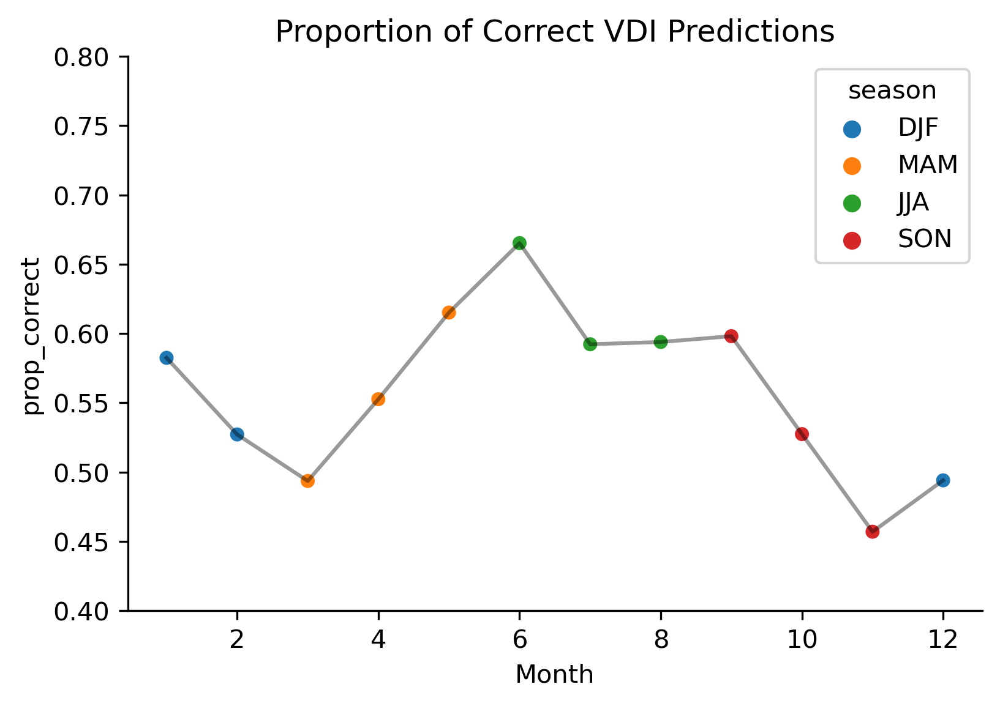

In [51]:
# sns.barplot(x='month', y='prop_correct', hue='season', data=month_df)
fig, ax = plt.subplots(figsize=(6, 4))
sns.lineplot(x='month_id', y='prop_correct', data=month_df, color='k', alpha=0.4)
sns.scatterplot(x='month_id', y='prop_correct', hue='season', data=month_df)

ylim = (0.6, 0.9) if TARGET_VAR == "VCI3M" else (0.4, 0.8)

# ax.get_legend().remove()
ax.set_ylim(ylim)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_title('Proportion of Correct VDI Predictions')
ax.set_xlabel('Month')


# ## Plot the Maps of each month performance
# fig, axs = plt.subplots(3, 4, figsize=(1.2*4, 1.5*3))

# for ix, month in enumerate(month_errors.time.values):
#     ax = axs[np.unravel_index(ix, (3, 4))]
#     month_errors.sel(time=month).plot(ax=ax, cmap='viridis_r', vmin=0, vmax=1, add_colorbar=False, )  # 
#     ax.set_title(calendar.month_abbr[month])
#     ax.axis('off')

# ax.set_xlim(0, 1)
# plt.tight_layout()

# Explore Inputs/Outputs

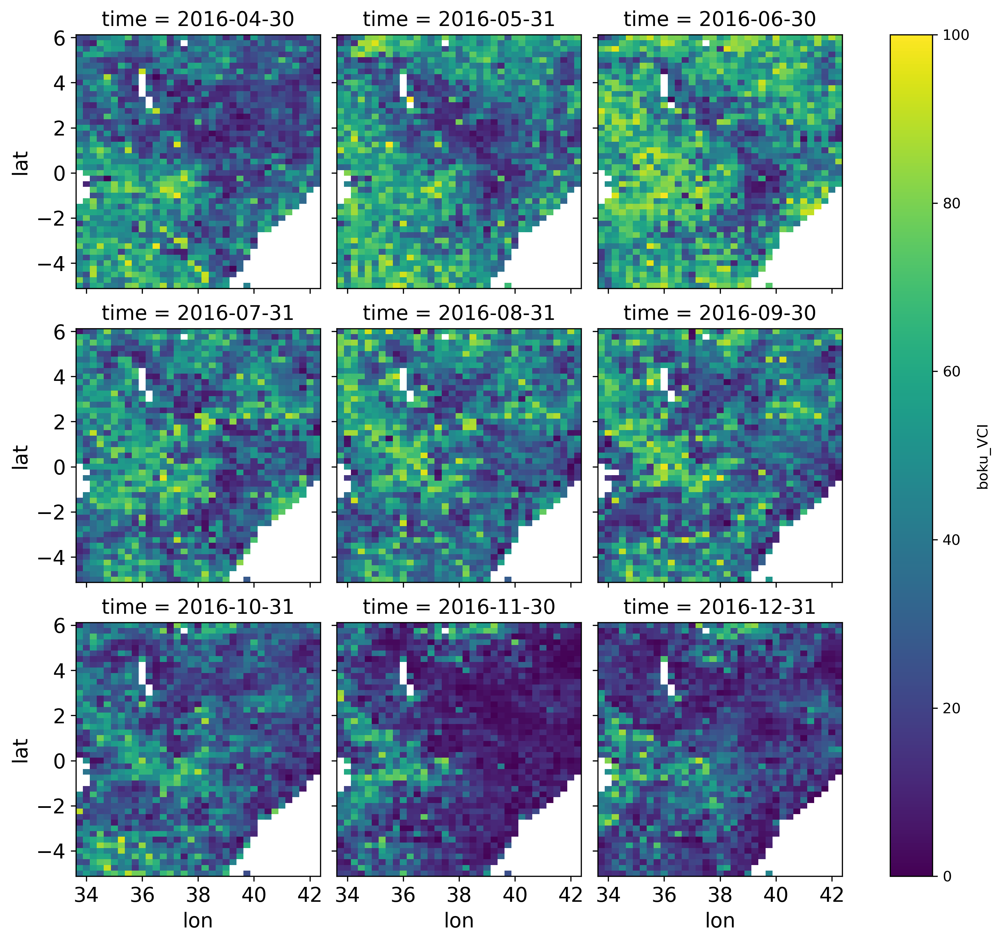

In [52]:
nrows = 1
ncols = 1
# fig, ax = plt.subplots(nrows, ncols, figsize=((8*ncols), (8*nrows)))

time = y_test.isel(time=0).time
g = y_test[TARGET_VAR].isel(time=slice(3, 12)).plot(col='time', col_wrap=3)

# kenya.plot(ax=ax, facecolor='none', edgecolor='k', lw=2, alpha=0.6, vmin=0, vmax=100)

for i, ax in enumerate(g.axes.flat):
    for item in ([ax.title, ax.xaxis.label, ax.yaxis.label]
                      + ax.get_xticklabels() + ax.get_yticklabels()):
            item.set_fontsize(14);

# ax.spines['top'].set_visible(False)
# ax.spines['right'].set_visible(False)
# ax.spines['left'].set_visible(False)
# ax.spines['bottom'].set_visible(False)
# fig = plt.gcf()

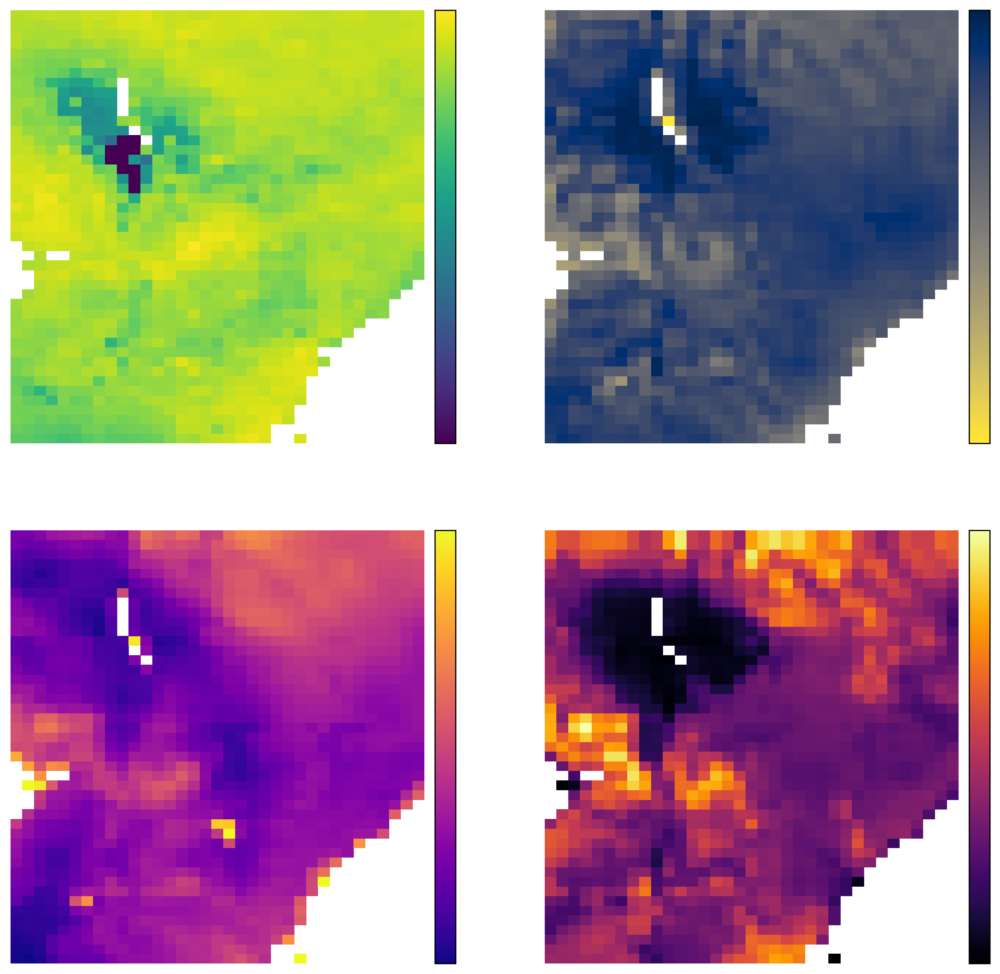

In [53]:
dynamic_vars = [v for v in dynamic_ds.data_vars][1:]
varnames = ["VCI", "Precipitation", "Evaporation", "2m Air Temperature"]
colormaps = ['viridis', 'cividis_r', 'plasma', 'inferno']

from mpl_toolkits.axes_grid1 import make_axes_locatable

fig, axs = plt.subplots(2, 2, figsize=(6*2, 6*2))
for ix, (var, name, cmap) in enumerate(zip(dynamic_vars, varnames, colormaps)):
    ax = axs[np.unravel_index(ix, (2, 2))]
    data = dynamic_ds[var].isel(time=10).where(~mask).values
    
    
    im = ax.pcolor(data, cmap=cmap)
    
    # colorbar
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('right', size='5%', pad=0.1)
    cbar = fig.colorbar(im, cax=cax, orientation='vertical',)
    cbar.ax.tick_params(labelsize=10)
    cbar.set_ticks([])
    
    ax.axis('off')
    
    # 
    # ax.set_title(name)
    ax.set_title('')
    for item in ([ax.title, ax.xaxis.label, ax.yaxis.label]
                  + ax.get_xticklabels() + ax.get_yticklabels()):
        item.set_fontsize(14);
    

In [54]:
static_vars = [v for v in static.data_vars if v not in ["lc_class", "lc_class_group"]]
static_vars = [v for v in static_vars if "global" not in v]
print(static_vars)

cmaps = ['cividis', 'plasma', 'inferno', 'viridis', "viridis", 'viridis', 'viridis', 'gist_earth', 'viridis', 'viridis', 'viridis', 'viridis', 'viridis', 'viridis', 'viridis', 'viridis'] #, 'tab10']

assert len(cmaps) == len(static_vars), print(f"{len(cmaps)}, {len(static_vars)}")
print(len(cmaps))

['precip_pixel_mean', 'e_pixel_mean', 'pev_pixel_mean', 'swvl1_pixel_mean', 'swvl2_pixel_mean', 'swvl3_pixel_mean', 'swvl4_pixel_mean', 'topography', 'cropland_rainfed_one_hot', 'herbaceous_cover_one_hot', 'tree_or_shrub_cover_one_hot', 'cropland_irrigated_or_postflooding_one_hot', 'tree_cover_one_hot', 'shrubland_one_hot', 'grassland_one_hot', 'bare_areas_one_hot']
16


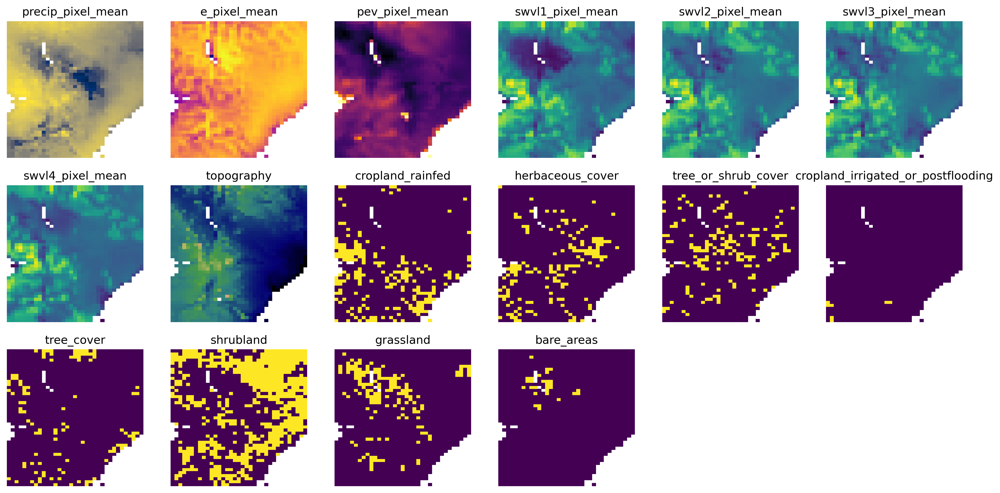

In [55]:
nrows = 3
ncols = 6
fig, axs = plt.subplots(nrows, ncols, figsize=(3*ncols, 3*nrows))

ix = 0
for ix, (var, cmap) in enumerate(zip(static_vars, cmaps)):
    var = static_vars[ix]
    cmap = cmaps[ix]

    ax = axs[np.unravel_index(ix, (nrows, ncols))]

    data = static[var].where(~mask).values
    im = ax.pcolor(data, cmap=cmap)
    ax.set_title(var.replace("_one_hot", "") if "one_hot" in var else var)
    ax.axis('off');

for ax in axs.flatten():
    ax.axis('off')

# Chop out Kenya

In [56]:
import geopandas as gpd

gdf = gpd.read_file(gpd.datasets.get_path("naturalearth_lowres"))
africa = gdf.query("continent == 'Africa'")

kenya = gdf.query("name == 'Kenya'")
from scripts.drafts.mask_using_shapefile import rasterize
shapes = [(shape, n) for n, shape in enumerate(kenya.geometry)]
xr_da = ds[TARGET_VAR]
kenya_xr = rasterize(
    shapes, xr_da.coords, longitude='lon', latitude='lat'
)
kenya_mask = np.isnan(kenya_xr)

# Explore regions

In [57]:
gdf = all_gdf.copy()

In [58]:
from typing import Optional

def highlight_selected_regions(regions: List[str], scale=1, colors: Optional[List[str]] = None):
    fig, ax = plt.subplots(figsize=(12*scale, 8*scale))
    gdf = all_gdf.loc[(all_gdf.model=='ealstm') & (all_gdf.datetime == all_gdf.datetime.min())]
    gdf.plot(ax=ax, color='#23748d')
    for ix, region in enumerate(regions):
        gdf_ = gdf.loc[gdf.region_name == region]
        gdf_.plot(color='#57bfd0' if colors is None else colors[ix], ax=ax, alpha=0.9)

        gdf_.apply(
            lambda x: ax.annotate(
                s=x.region_name, xy=x.geometry.centroid.coords[0], ha='center'
            ), 
            axis=1
        )
        
        ax.set_axis_off()

regions = ['MARSABIT', 'TURKANA', 'WAJIR', 'MANDERA', 'SAMBURU', 'ISIOLO', 'LAIKIPIA', 'MOYALE', 'KAJIADO']
regions = ["MARSABIT", "KIAMBU", "HOMA BAY", "KWALE"]
colors = ["C0", "C1", "C2", "C3", "C4"]

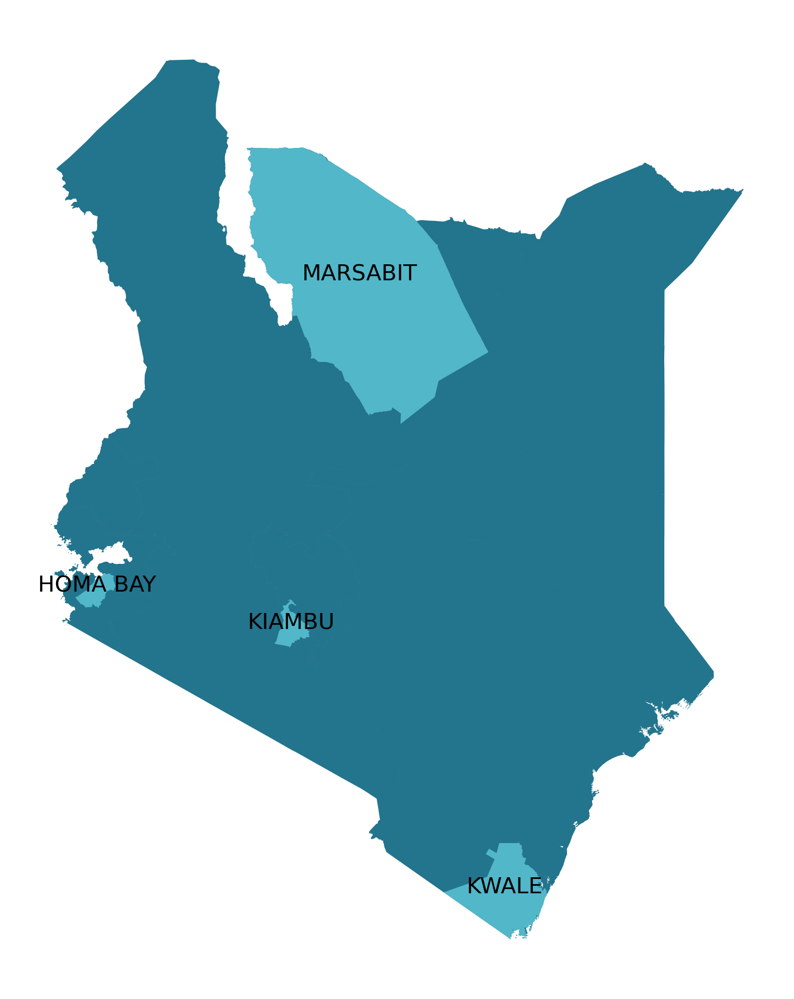

In [59]:
highlight_selected_regions(regions)
# fig, ax = plt.subplots(figsize=(12*scale, 8*scale))
# all_gdf.loc[(all_gdf.model=='ealstm') & (all_gdf.datetime == all_gdf.datetime.min())]